# **Implémentez un modèle de scoring**

## Contexte
Le secteur du crédit à la consommation évolue rapidement. Il est nécessaire d'évaluer de manière précise et efficace le risque de crédit.

## Objectif
L'objectif est de calculer la probabilité qu’un client rembourse son crédit et de classer automatiquement les demandes en crédits accordés ou refusés.

## Mission de ce notebook

- Explorer les données : Faire une analyse exploratoire. 
- Prétraiter les données : Nettoyer et préparer les données pour l'analyse, traiter les données manquantes, les outliers, et normaliser les données.
- Extraire les features : Sélectionner les caractéristiques les plus pertinentes qui influencent le risque de crédit.


## Source
- https://www.kaggle.com/c/home-credit-default-risk/data
- https://www.kaggle.com/code/willkoehrsen/start-here-a-gentle-introduction/notebook#Conclusions
- https://www.kaggle.com/code/jsaguiar/lightgbm-with-simple-features/script

In [62]:
from jyquickhelper import add_notebook_menu
add_notebook_menu(first_level=1)

# Chargement des données

## Importation des bibliothèques

In [63]:
import pandas as pd
import numpy as np
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
import gc
import time
import os
import matplotlib.image as img
import requests
import warnings
import io
import missingno as msno
import re
import lightgbm as lgb
import pickle
import joblib

from contextlib import contextmanager
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, roc_curve, fbeta_score
from sklearn.model_selection import KFold, StratifiedKFold
from IPython.display import display, HTML
from PIL import Image
from io import BytesIO
from typing import List, Tuple
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV

from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split


from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE



# MLFlow
import mlflow
import mlflow.lightgbm
import mlflow.xgboost
from mlflow import MlflowClient
from mlflow.models.signature import infer_signature
from pprint import pprint

from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier
from sklearn.metrics import make_scorer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from sklearn.metrics import roc_curve, auc

from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay

from pprint import pprint

import shap
shap.initjs()

In [64]:
# afficher les versions des librairies
print('\n'.join(f'{m.__name__} - {m.__version__}'
                for m in globals().values()
                if getattr(m, '__version__', None)))

pandas - 2.0.3
numpy - 1.24.3
sklearn - 1.2.2
seaborn - 0.13.0
requests - 2.31.0
missingno - 0.5.2
re - 2.2.1
lightgbm - 4.2.0
joblib - 1.2.0
PIL.Image - 10.0.1
mlflow - 2.9.2
shap - 0.44.0


In [65]:
# definir le nombre maximal de colonnes a afficher
pd.set_option('display.max_columns', None)

# definir la largeur maximale de la colonne
pd.set_option('display.max_colwidth', None)

pd.set_option('display.float_format', lambda x: f'{x:,.2f}')

# palette de couleur des graphiques seaborn
sns.set_palette("pastel")

warnings.filterwarnings('ignore')

## Diagramme entité-relation

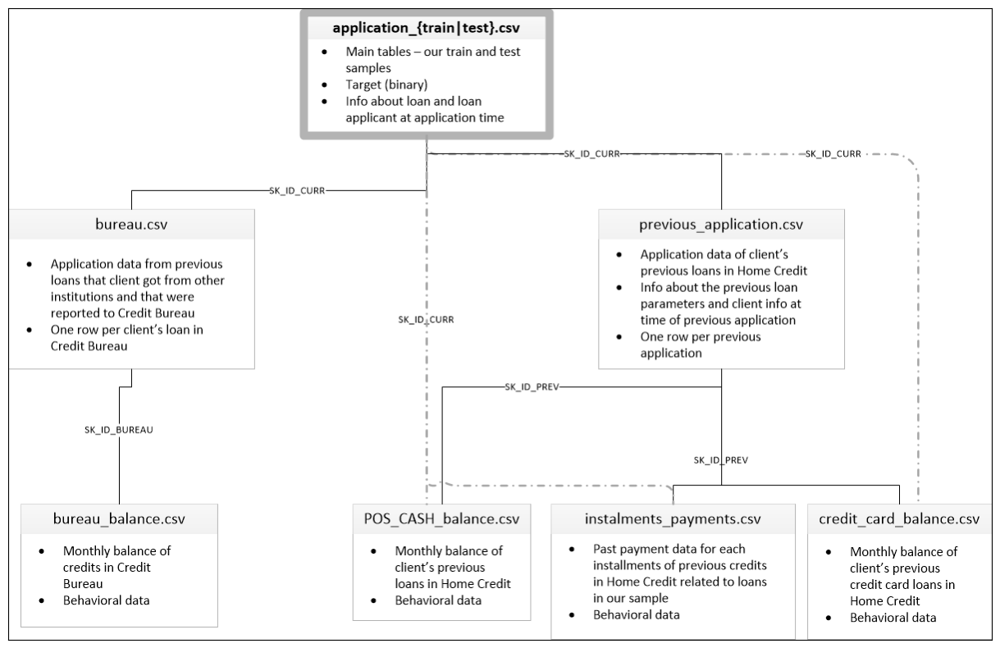

In [66]:
# URL de l'image
url = 'https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png'
response = requests.get(url)

image = Image.open(BytesIO(response.content))
plt.figure(figsize=(17, 10))
plt.xticks([])
plt.yticks([])
plt.imshow(image)
plt.show()

## Lecture des données

In [67]:
def load_csv_files(filenames):
    df = {}
    for file in filenames:
        # Suppression des préfixes et suffixes indésirables
        prefix = file.replace("olist_", "").replace("_dataset", "").split('.')[0]
        df[prefix] = pd.read_csv(file)
    return df

def get_file_size(file_name: str) -> Tuple[str, float]:
    size = os.stat(file_name).st_size / 2**10  # KB
    return (file_name, size)

def display_file_sizes(file_list: List[str]) -> None:
    for file_name in file_list:
        name, size = get_file_size(file_name)
        display(f"- {name}, Taille: {size:.2f} KB")

In [68]:
# Liste des fichiers CSV à charger
filename = [
    "application_train.csv",
    "application_test.csv",
    "bureau.csv",
    "bureau_balance.csv",
    "previous_application.csv",
    "POS_CASH_balance.csv",
    "installments_payments.csv",
    "credit_card_balance.csv"
]

In [69]:
df_l = load_csv_files(filename)
train =  df_l['application_train'].copy()
test =  df_l['application_test'].copy()

# Première inspection des données

## Aperçu des premières lignes

In [70]:
df_l

{'application_train':         SK_ID_CURR  TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
 0           100002       1         Cash loans           M            N   
 1           100003       0         Cash loans           F            N   
 2           100004       0    Revolving loans           M            Y   
 3           100006       0         Cash loans           F            N   
 4           100007       0         Cash loans           M            N   
 ...            ...     ...                ...         ...          ...   
 307506      456251       0         Cash loans           M            N   
 307507      456252       0         Cash loans           F            N   
 307508      456253       0         Cash loans           F            N   
 307509      456254       1         Cash loans           F            N   
 307510      456255       0         Cash loans           F            N   
 
        FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL   AMT_CREDIT  \
 0   

## Description statistique

In [71]:
# Fonction affiche des informations head, columns, shape, info, describe sur le DataFrame.
def info_df(data: pd.DataFrame, n_head_rows: int = 5) -> None:

    # premières lignes du dataframe
    display(HTML('<h3 style="color: blue;">Premières Lignes:</h3>'))
    display(data.head(n_head_rows))
    display("--"*50)

    # colonnes
    display(HTML('<h3 style="color: blue;">Colonnes:</h3>'))
    display(data.columns)
    display("--"*50)

    # dimension
    display(HTML('<h3 style="color: blue;">Dimension:</h3>'))
    display(data.shape)
    display("--"*50)

    # informations
    display(HTML('<h3 style="color: blue;">Info:</h3>'))
    buffer = io.StringIO()
    data.info(buf=buffer)
    s = buffer.getvalue()
    display(HTML('<pre>' + s + '</pre>'))
    display("--"*50)

    # statistiques descriptives
    display(HTML('<h3 style="color: blue;">Description:</h3>'))
    display(data.describe())
    display("--"*50)

In [72]:
for name, df in  df_l.items():
    display(HTML(f'<h2 style="color: green;">{name.upper()}</h2>'))
    info_df(df)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,"202,500.00","406,597.50","24,700.50","351,000.00",Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,-637,"-3,648.00",-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.08,0.26,0.14,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.63,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,reg oper account,block of flats,0.01,"Stone, brick",No,2.00,2.00,2.00,2.00,"-1,134.00",0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
1,100003,0,Cash loans,F,N,N,0,"270,000.00","1,293,502.50","35,698.50","1,129,500.00",Family,State servant,Higher education,Married,House / apartment,0.00,-16765,-1188,"-1,186.00",-291,NaN,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.31,0.62,NaN,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.05,0.00,0.01,0.09,0.05,0.99,0.80,0.05,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.00,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.01,reg oper account,block of flats,0.07,Block,No,1.00,0.00,1.00,0.00,-828.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,0,Revolving loans,M,Y,Y,0,"67,500.00","135,000.00","6,750.00","135,000.00",Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-19046,-225,"-4,260.00",-2531,26.00,1,1,1,1,1,0,Laborers,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.56,0.73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,-815.00,0,0

'----------------------------------------------------------------------------------------------------'

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

'----------------------------------------------------------------------------------------------------'

(307511, 122)

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,"307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,499.00","307,233.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","104,582.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,509.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","134,133.00","306,851.00","246,546.00","151,450.00","127,568.00","157,504.00","103,023.00","92,646.00","143,620.00","152,683.00","154,491.00","98,869.00","124,921.00","97,312.00","153,161.00","93,997.00","137,829.00","151,450.00","127,568.00","157,504.00","103,023.00","92,646.00","143,620.00","152,683.00","154,491.00","98,869.00","124,921.00","97,312.00","153,161.00","93,997.00","137,829.00","151,450.00","127,568.00","157,504.00","103,023.00","92,646.00","143,620.00","152,683.00","154,491.00","98,869.00","124,921.00","97,312.00","153,161.00","93,997.00","137,829.00","159,080.00","306,490.00","306,490.00","306,490.00","306,490.00","307,510.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","307,511.00","265,992.00","265,992.00","265,992.00","265,992.00","265,992.00","265,992.00"
mean,"278,180.52",0.08,0.42,"168,797.92","599,026.00","27,108.57","538,396.21",0.02,"-16,037.00","63,815.05","-4,986.12","-2,994.20",12.06,1.00,0.82,0.20,1.00,0.28,0.06,2.15,2.05,2.03,12.06,0.02,0.05,0.04,0.08,0.23,0.18,0.50,0.51,0.51,0.12,0.09,0.98,0.75,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.11,0.09,0.98,0.76,0.04,0.07,0.15,0.22,0.23,0.06,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.76,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.10,1.42,0.14,1.41,0.10,-962.86,0.00,0.71,0.00,0.02,0.09,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.03,0.27,0.27,1.90
std,"102,790.18",0.27,0.72,"237,123.15","402,490.78","14,493.74","369,446.46",0.01,"4,363.99","141,275

'----------------------------------------------------------------------------------------------------'

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,"135,000.00","568,800.00","20,560.50","450,000.00",Unaccompanied,Working,Higher education,Married,House / apartment,0.02,-19241,-2329,"-5,170.00",-812,NaN,1,1,0,1,0,1,NaN,2.00,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.75,0.79,0.16,0.07,0.06,0.97,NaN,NaN,NaN,0.14,0.12,NaN,NaN,NaN,0.05,NaN,NaN,0.07,0.06,0.97,NaN,NaN,NaN,0.14,0.12,NaN,NaN,NaN,0.05,NaN,NaN,0.07,0.06,0.97,NaN,NaN,NaN,0.14,0.12,NaN,NaN,NaN,0.05,NaN,NaN,NaN,block of flats,0.04,"Stone, brick",No,0.00,0.00,0.00,0.00,"-1,740.00",0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
1,100005,Cash loans,M,N,Y,0,"99,000.00","222,768.00","17,370.00","180,000.00",Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.04,-18064,-4469,"-9,118.00",-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.00,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.56,0.29,0.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,3.00
2,100013,Cash loans,M,Y,Y,0,"202,500.00","663,264.00","69,777.00","630,000.00",NaN,Working,Higher education,Married,House / apartment,0.02,-20038,-4458,"-2,175.00",-3503,5.00,1,1,0,1,0,0,Drivers,2.00,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.70,0.61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,-856.00,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,1.00,4.00
3,100028,Cash loans,F,N,Y,2,"315,000.00","1,575,000.00","49,018.50","1,575,000.00",Unaccompanied,Workin

'----------------------------------------------------------------------------------------------------'

Index(['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=121)

'----------------------------------------------------------------------------------------------------'

(48744, 121)

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,"48,744.00","48,744.00","48,744.00","48,744.00","48,720.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","16,432.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","28,212.00","48,736.00","40,076.00","24,857.00","21,103.00","25,888.00","16,926.00","15,249.00","23,555.00","25,165.00","25,423.00","16,278.00","20,490.00","15,964.00","25,192.00","15,397.00","22,660.00","24,857.00","21,103.00","25,888.00","16,926.00","15,249.00","23,555.00","25,165.00","25,423.00","16,278.00","20,490.00","15,964.00","25,192.00","15,397.00","22,660.00","24,857.00","21,103.00","25,888.00","16,926.00","15,249.00","23,555.00","25,165.00","25,423.00","16,278.00","20,490.00","15,964.00","25,192.00","15,397.00","22,660.00","26,120.00","48,715.00","48,715.00","48,715.00","48,715.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","48,744.00","42,695.00","42,695.00","42,695.00","42,695.00","42,695.00","42,695.00"
mean,"277,796.68",0.40,"178,431.81","516,740.44","29,426.24","462,618.84",0.02,"-16,068.08","67,485.37","-4,967.65","-3,051.71",11.79,1.00,0.81,0.20,1.00,0.26,0.16,2.15,2.04,2.01,12.01,0.02,0.06,0.04,0.08,0.22,0.17,0.50,0.52,0.50,0.12,0.09,0.98,0.75,0.05,0.09,0.15,0.23,0.24,0.07,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.76,0.05,0.08,0.15,0.23,0.23,0.07,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.75,0.05,0.08,0.15,0.23,0.24,0.07,0.11,0.11,0.01,0.03,0.11,1.45,0.14,1.44,0.10,"-1,077.77",0.00,0.79,0.00,0.01,0.09,0.00,0.09,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.55,1.98
std,"103,169.55",0.71,"101,522.59","365,397.00","16,016.37","336,710.22",0.01,"4,325.90","144,348.51","3,552.61","1,569.28",11.46,0.00,0.39,0.40,0.04,0.44,0.37,0.89,0.52,0.52,3.28,0.14,0.23,0.20,0.27,0.42,0.38,0.21,0

'----------------------------------------------------------------------------------------------------'

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.00,-153.00,NaN,0,"91,323.00",0.00,NaN,0.00,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,"1,075.00",NaN,NaN,0,"225,000.00","171,342.00",NaN,0.00,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.00,NaN,NaN,0,"464,323.50",NaN,NaN,0.00,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,"90,000.00",NaN,NaN,0.00,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,"1,197.00",NaN,"77,674.50",0,"2,700,000.00",NaN,NaN,0.00,Consumer credit,-21,NaN


'----------------------------------------------------------------------------------------------------'

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')

'----------------------------------------------------------------------------------------------------'

(1716428, 17)

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,"1,716,428.00","1,716,428.00","1,716,428.00","1,716,428.00","1,610,875.00","1,082,775.00","591,940.00","1,716,428.00","1,716,415.00","1,458,759.00","1,124,648.00","1,716,428.00","1,716,428.00","489,637.00"
mean,"278,214.93","5,924,434.49","-1,142.11",0.82,510.52,"-1,017.44","3,825.42",0.01,"354,994.59","137,085.12","6,229.51",37.91,-593.75,"15,712.76"
std,"102,938.56","532,265.73",795.16,36.54,"4,994.22",714.01,"206,031.61",0.10,"1,149,811.34","677,401.13","45,032.03","5,937.65",720.75,"325,826.95"
min,"100,001.00","5,000,000.00","-2,922.00",0.00,"-42,060.00","-42,023.00",0.00,0.00,0.00,"-4,705,600.32","-586,406.11",0.00,"-41,947.00",0.00
25%,"188,866.75","5,463,953.75","-1,666.00",0.00,"-1,138.00","-1,489.00",0.00,0.00,"51,300.00",0.00,0.00,0.00,-908.00,0.00
50%,"278,055.00","5,926,303.50",-987.00,0.00,-330.00,-897.00,0.00,0.00,"125,518.50",0.00,0.00,0.00,-395.00,0.00
75%,"367,426.00","6,385,681.25",-474.00,0.00,474.00,-425.00,0.00,0.00,"315,000.00","40,153.50",0.00,0.00,-33.00,"13,500.00"
max,"456,255.00","6,843,457.00",0.00,"2,792.00","31,199.00",0.00,"115,987,185.00",9.00,"585,000,000.00","170,100,000.00","4,705,600.32","3,756,681.00",372.00,"118,453,423.50"


'----------------------------------------------------------------------------------------------------'

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


'----------------------------------------------------------------------------------------------------'

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

'----------------------------------------------------------------------------------------------------'

(27299925, 3)

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,SK_ID_BUREAU,MONTHS_BALANCE
count,"27,299,925.00","27,299,925.00"
mean,"6,036,297.33",-30.74
std,"492,348.86",23.86
min,"5,001,709.00",-96.00
25%,"5,730,933.00",-46.00
50%,"6,070,821.00",-25.00
75%,"6,431,951.00",-11.00
max,"6,842,888.00",0.00


'----------------------------------------------------------------------------------------------------'

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,"1,730.43","17,145.00","17,145.00",0.00,"17,145.00",SATURDAY,15,Y,1,0.00,0.18,0.87,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,"365,243.00",-42.00,300.00,-42.00,-37.00,0.00
1,2802425,108129,Cash loans,"25,188.62","607,500.00","679,671.00",NaN,"607,500.00",THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,"365,243.00",-134.00,916.00,"365,243.00","365,243.00",1.00
2,2523466,122040,Cash loans,"15,060.74","112,500.00","136,444.50",NaN,"112,500.00",TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,"365,243.00",-271.00,59.00,"365,243.00","365,243.00",1.00
3,2819243,176158,Cash loans,"47,041.33","450,000.00","470,790.00",NaN,"450,000.00",MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,"365,243.00",-482.00,-152.00,-182.00,-177.00,1.00
4,1784265,202054,Cash loans,"31,924.40","337,500.00","404,055.00",NaN,"337,500.00",THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


'----------------------------------------------------------------------------------------------------'

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

'----------------------------------------------------------------------------------------------------'

(1670214, 37)

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,"1,670,214.00","1,670,214.00","1,297,979.00","1,670,214.00","1,670,213.00","774,370.00","1,284,699.00","1,670,214.00","1,670,214.00","774,370.00","5,951.00","5,951.00","1,670,214.00","1,670,214.00","1,297,984.00","997,149.00","997,149.00","997,149.00","997,149.00","997,149.00","997,149.00"
mean,"1,923,089.14","278,357.17","15,955.12","175,233.86","196,114.02","6,697.40","227,847.28",12.48,1.00,0.08,0.19,0.77,-880.68,313.95,16.05,"342,209.86","13,826.27","33,767.77","76,582.40","81,992.34",0.33
std,"532,597.96","102,814.82","14,782.14","292,779.76","318,574.62","20,921.50","315,396.56",3.33,0.06,0.11,0.09,0.10,779.10,"7,127.44",14.57,"88,916.12","72,444.87","106,857.03","149,647.42","153,303.52",0.47
min,"1,000,001.00","100,001.00",0.00,0.00,0.00,-0.90,0.00,0.00,0.00,-0.00,0.03,0.37,"-2,922.00",-1.00,0.00,"-2,922.00","-2,892.00","-2,801.00","-2,889.00","-2,874.00",0.00
25%,"1,461,857.25","189,329.00","6,321.78","18,720.00","24,160.50",0.00,"50,841.00",10.00,1.00,0.00,0.16,0.72,"-1,300.00",-1.00,6.00,"365,243.00","-1,628.00","-1,242.00","-1,314.00","-1,270.00",0.00
50%,"1,923,110.50","278,714.50","11,250.00","71,046.00","80,541.00","1,638.00","112,320.00",12.00,1.00,0.05,0.19,0.84,-581.00,3.00,12.00,"365,243.00",-831.00,-361.00,-537.00,-499.00,0.00
75%,"2,384,279.75","367,514.00","20,658.42","180,360.00","216,418.50","7,740.00","234,000.00",15.00,1.00,0.11,0.19,0.85,-280.00,82.00,24.00,"365,243.00",-411.00,129.00,-74.00,-44.00,1.00
max,"2,845,382.00","456,255.00","418,058.15","6,905,160.00","6,905,160.00","3,060,045.00","6,905,160.00",23.00,1.00,1.00,1.00,1.00,-1.00,"4,000,000.00",84.00,"365,243.00","365,243.00","365,243.00","365,243.00","365,243.00",1.00


'----------------------------------------------------------------------------------------------------'

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.00,45.00,Active,0,0
1,1715348,367990,-33,36.00,35.00,Active,0,0
2,1784872,397406,-32,12.00,9.00,Active,0,0
3,1903291,269225,-35,48.00,42.00,Active,0,0
4,2341044,334279,-35,36.00,35.00,Active,0,0


'----------------------------------------------------------------------------------------------------'

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

'----------------------------------------------------------------------------------------------------'

(10001358, 8)

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,"10,001,358.00","10,001,358.00","10,001,358.00","9,975,287.00","9,975,271.00","10,001,358.00","10,001,358.00"
mean,"1,903,216.60","278,403.86",-35.01,17.09,10.48,11.61,0.65
std,"535,846.53","102,763.75",26.07,12.00,11.11,132.71,32.76
min,"1,000,001.00","100,001.00",-96.00,1.00,0.00,0.00,0.00
25%,"1,434,405.00","189,550.00",-54.00,10.00,3.00,0.00,0.00
50%,"1,896,565.00","278,654.00",-28.00,12.00,7.00,0.00,0.00
75%,"2,368,963.00","367,429.00",-13.00,24.00,14.00,0.00,0.00
max,"2,843,499.00","456,255.00",-1.00,92.00,85.00,"4,231.00","3,595.00"


'----------------------------------------------------------------------------------------------------'

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.00,6,"-1,180.00","-1,187.00","6,948.36","6,948.36"
1,1330831,151639,0.00,34,"-2,156.00","-2,156.00","1,716.53","1,716.53"
2,2085231,193053,2.00,1,-63.00,-63.00,"25,425.00","25,425.00"
3,2452527,199697,1.00,3,"-2,418.00","-2,426.00","24,350.13","24,350.13"
4,2714724,167756,1.00,2,"-1,383.00","-1,366.00","2,165.04","2,160.59"


'----------------------------------------------------------------------------------------------------'

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')

'----------------------------------------------------------------------------------------------------'

(13605401, 8)

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,"13,605,401.00","13,605,401.00","13,605,401.00","13,605,401.00","13,605,401.00","13,602,496.00","13,605,401.00","13,602,496.00"
mean,"1,903,364.97","278,444.88",0.86,18.87,"-1,042.27","-1,051.11","17,050.91","17,238.22"
std,"536,202.91","102,718.31",1.04,26.66,800.95,800.59,"50,570.25","54,735.78"
min,"1,000,001.00","100,001.00",0.00,1.00,"-2,922.00","-4,921.00",0.00,0.00
25%,"1,434,191.00","189,639.00",0.00,4.00,"-1,654.00","-1,662.00","4,226.09","3,398.26"
50%,"1,896,520.00","278,685.00",1.00,8.00,-818.00,-827.00,"8,884.08","8,125.52"
75%,"2,369,094.00","367,530.00",1.00,19.00,-361.00,-370.00,"16,710.21","16,108.42"
max,"2,843,499.00","456,255.00",178.00,277.00,-1.00,-1.00,"3,771,487.85","3,771,487.85"


'----------------------------------------------------------------------------------------------------'

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.97,135000,0.00,877.50,0.00,877.50,"1,700.33","1,800.00","1,800.00",0.00,0.00,0.00,0.00,1,0.00,1.00,35.00,Active,0,0
1,2582071,363914,-1,"63,975.56",45000,"2,250.00","2,250.00",0.00,0.00,"2,250.00","2,250.00","2,250.00","60,175.08","64,875.56","64,875.56",1.00,1,0.00,0.00,69.00,Active,0,0
2,1740877,371185,-7,"31,815.22",450000,0.00,0.00,0.00,0.00,"2,250.00","2,250.00","2,250.00","26,926.42","31,460.08","31,460.08",0.00,0,0.00,0.00,30.00,Active,0,0
3,1389973,337855,-4,"236,572.11",225000,"2,250.00","2,250.00",0.00,0.00,"11,795.76","11,925.00","11,925.00","224,949.29","233,048.97","233,048.97",1.00,1,0.00,0.00,10.00,Active,0,0
4,1891521,126868,-1,"453,919.46",450000,0.00,"11,547.00",0.00,"11,547.00","22,924.89","27,000.00","27,000.00","443,044.40","453,919.46","453,919.46",0.00,1,0.00,1.00,101.00,Active,0,0


'----------------------------------------------------------------------------------------------------'

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

'----------------------------------------------------------------------------------------------------'

(3840312, 23)

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,"3,840,312.00","3,840,312.00","3,840,312.00","3,840,312.00","3,840,312.00","3,090,496.00","3,840,312.00","3,090,496.00","3,090,496.00","3,535,076.00","3,072,324.00","3,840,312.00","3,840,312.00","3,840,312.00","3,840,312.00","3,090,496.00","3,840,312.00","3,090,496.00","3,090,496.00","3,535,076.00","3,840,312.00","3,840,312.00"
mean,"1,904,503.59","278,324.21",-34.52,"58,300.16","153,807.96","5,961.32","7,433.39",288.17,"2,968.80","3,540.20","10,280.54","7,588.86","55,965.88","58,088.81","58,098.29",0.31,0.70,0.00,0.56,20.83,9.28,0.33
std,"536,469.47","102,704.48",26.67,"106,307.03","165,145.70","28,225.69","33,846.08","8,201.99","20,796.89","5,600.15","36,078.08","32,005.99","102,533.62","105,965.37","105,971.80",1.10,3.19,0.08,3.24,20.05,97.52,21.48
min,"1,000,018.00","100,006.00",-96.00,"-420,250.18",0.00,"-6,827.31","-6,211.62",0.00,0.00,0.00,0.00,0.00,"-423,305.82","-420,250.18","-420,250.18",0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,"1,434,385.00","189,517.00",-55.00,0.00,"45,000.00",0.00,0.00,0.00,0.00,0.00,152.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,0.00
50%,"1,897,122.00","278,396.00",-28.00,0.00,"112,500.00",0.00,0.00,0.00,0.00,0.00,"2,702.70",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,15.00,0.00,0.00
75%,"2,369,327.75","367,580.00",-11.00,"89,046.69","180,000.00",0.00,0.00,0.00,0.00,"6,633.91","9,000.00","6,750.00","85,359.24","88,899.49","88,914.51",0.00,0.00,0.00,0.00,32.00,0.00,0.00
max,"2,843,496.00","456,250.00",-1.00,"1,505,902.19","1,350,000.00","2,115,000.00","2,287,098.31","1,529,847.00","2,239,274.16","202,882.01","4,289,207.45","4,278,315.69","1,472,316.79","1,493,338.19","1,493,338.19",51.00,165.00,12.00,165.00,120.00,"3,260.00","3,260.00"


'----------------------------------------------------------------------------------------------------'

** APPLICATION_TRAIN
 - Dimension: 128,091 entrées, 122 colonnes.
 - Données clés: Informations personnelles et financières des demandeurs de prêt, y compris le revenu, le type de prêt, l'état civil, le type de logement, et plus.
 - Points à noter: Contient la TARGET (le label que nous voulons prédire). Présence de diverses variables numériques et catégorielles, avec des informations détaillées sur chaque candidat au prêt.

** APPLICATION_TEST
 - Dimension: 48,744 entrées, 121 colonnes.
 - Données clés: Similaires à APPLICATION_TRAIN, mais utilisées pour tester les modèles de prédiction.
 - Points à noter: Moins d'entrées que le jeu de données d'entraînement, mais similaire en termes de structure et de types de données.

** BUREAU
 - Dimension: 708,871 entrées, 17 colonnes.
 - Données clés: Informations sur les crédits antérieurs du demandeur enregistrés dans d'autres institutions financières.
 - Points à noter: Inclut des détails comme l'état du crédit, le montant, la durée, et les jours depuis le dernier crédit.

** BUREAU_BALANCE
 - Dimension: 5,033,716 entrées, 3 colonnes.
 - Données clés: Historique mensuel des crédits précédents du demandeur de prêt.
 - Points à noter: Contient des informations sur le solde du crédit pour chaque mois.

** PREVIOUS_APPLICATION
 - Dimension: 288,239 entrées, 37 colonnes.
 - Données clés: Informations sur les demandes de prêt antérieures du demandeur chez Home Credit.
 - Points à noter: Détails sur le montant demandé, le montant accordé, la durée, le type de prêt, et l'état de la demande.
    
** POS_CASH_BALANCE
 - Dimension: 1,787,687 entrées, 8 colonnes.
 - Données clés: Historique des paiements des crédits en magasin.
 - Points à noter: Inclut des informations sur les paiements mensuels, le statut du contrat, et les jours de retard.

** INSTALLMENTS_PAYMENTS
 - Dimension: 1,302,056 entrées, 8 colonnes.
 - Données clés: Historique des paiements des versements précédents.
 - Points à noter: Détails sur le montant et le calendrier des paiements, y compris les retards.

** CREDIT_CARD_BALANCE
 - Dimension: 639,468 entrées, 23 colonnes.
 - Données clés: Historique mensuel des soldes des cartes de crédit.
 - Points à noter: Informations sur le solde, la limite de crédit, les montants des retraits, et le statut du paiement.

** Tendances générales :
 - Diversité des données: Chaque table offre un aperçu unique des aspects financiers et personnels des demandeurs de prêt.
 - Volume de données: Une grande quantité d'informations est disponible, allant des données démographiques aux historiques financiers détaillés.

## Analyse de la qualité des données

### Recherche de valeurs manquantes

In [73]:
def missing_values_df(df):

    # Valeurs manquantes
    display(HTML('<h3 style="color: blue;">Valeurs Manquantes:</h3>'))
    total_manquantes = df.isnull().sum().sum()
    display(f"Total des valeurs manquantes: {total_manquantes}")
    display(df.isnull().sum())
    display("--"*50)

    # Duplicatas
    display(HTML('<h3 style="color: blue;">Duplicatas:</h3>'))
    total_duplicatas = df.duplicated().sum()
    display(f"Total des duplicatas (lignes identiques) dans le DataFrame: {total_duplicatas}")
    display("--"*50)

    # Tableau
    display("--"*50)
    display(HTML('<h3 style="color: blue;">Valeurs manquantes par colonnes (%):</h3>'))
    table = missing_values_table(df)
    display(table.head(50))

    # Valeur unique
    display(HTML('<h3 style="color: blue;">Valeurs Uniques:</h3>'))
    n = df.nunique(axis=0)
    display("Nombre de valeurs uniques dans chaque colonne :")
    for index, value in n.items():
        display(f"{index}: {value}")
    display("--"*50)
    display("--"*50)


    # Visualiser les données manquantes avec missingno
    display(HTML('<h3 style="color: #4169E1;"> Matrice des Données Manquantes:</h3>'))
    msno.bar(df, color=(0.25, 0.45, 0.6), fontsize=12)
    plt.title("Barres de Données Manquantes", fontsize=20)
    plt.xlabel("Colonnes", fontsize=15)
    plt.ylabel("Proportion de Données Non Manquantes", fontsize=15)
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()
    
# Fonction de calcul du nombre de valeurs manquantes 
def missing_values_table(df):
    
    # Calculer le nombre total de valeurs manquantes
    mis_val = df.isnull().sum()

    # Calculer le pourcentage de valeurs manquantes
    mis_val_percent = 100 * df.isnull().sum() / len(df)

    # Créer un tableau avec les résultats
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

    # Renommer les colonnes
    mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Valeurs manquantes', 1 : '% du total des valeurs'})

    # Trier le tableau par pourcentage de valeurs manquantes, en ordre décroissant
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% du total des valeurs', ascending=False).round(1)

    # Retourner le dataframe avec les informations sur les valeurs manquantes
    return mis_val_table_ren_columns

'Total des valeurs manquantes: 9152465'

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

'----------------------------------------------------------------------------------------------------'

'Total des duplicatas (lignes identiques) dans le DataFrame: 0'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,Valeurs manquantes,% du total des valeurs
COMMONAREA_MEDI,214865,69.90
COMMONAREA_AVG,214865,69.90
COMMONAREA_MODE,214865,69.90
NONLIVINGAPARTMENTS_MEDI,213514,69.40
NONLIVINGAPARTMENTS_MODE,213514,69.40
NONLIVINGAPARTMENTS_AVG,213514,69.40
FONDKAPREMONT_MODE,210295,68.40
LIVINGAPARTMENTS_MODE,210199,68.40
LIVINGAPARTMENTS_MEDI,210199,68.40
LIVINGAPARTMENTS_AVG,210199,68.40


'Nombre de valeurs uniques dans chaque colonne :'

'SK_ID_CURR: 307511'

'TARGET: 2'

'NAME_CONTRACT_TYPE: 2'

'CODE_GENDER: 3'

'FLAG_OWN_CAR: 2'

'FLAG_OWN_REALTY: 2'

'CNT_CHILDREN: 15'

'AMT_INCOME_TOTAL: 2548'

'AMT_CREDIT: 5603'

'AMT_ANNUITY: 13672'

'AMT_GOODS_PRICE: 1002'

'NAME_TYPE_SUITE: 7'

'NAME_INCOME_TYPE: 8'

'NAME_EDUCATION_TYPE: 5'

'NAME_FAMILY_STATUS: 6'

'NAME_HOUSING_TYPE: 6'

'REGION_POPULATION_RELATIVE: 81'

'DAYS_BIRTH: 17460'

'DAYS_EMPLOYED: 12574'

'DAYS_REGISTRATION: 15688'

'DAYS_ID_PUBLISH: 6168'

'OWN_CAR_AGE: 62'

'FLAG_MOBIL: 2'

'FLAG_EMP_PHONE: 2'

'FLAG_WORK_PHONE: 2'

'FLAG_CONT_MOBILE: 2'

'FLAG_PHONE: 2'

'FLAG_EMAIL: 2'

'OCCUPATION_TYPE: 18'

'CNT_FAM_MEMBERS: 17'

'REGION_RATING_CLIENT: 3'

'REGION_RATING_CLIENT_W_CITY: 3'

'WEEKDAY_APPR_PROCESS_START: 7'

'HOUR_APPR_PROCESS_START: 24'

'REG_REGION_NOT_LIVE_REGION: 2'

'REG_REGION_NOT_WORK_REGION: 2'

'LIVE_REGION_NOT_WORK_REGION: 2'

'REG_CITY_NOT_LIVE_CITY: 2'

'REG_CITY_NOT_WORK_CITY: 2'

'LIVE_CITY_NOT_WORK_CITY: 2'

'ORGANIZATION_TYPE: 58'

'EXT_SOURCE_1: 114584'

'EXT_SOURCE_2: 119831'

'EXT_SOURCE_3: 814'

'APARTMENTS_AVG: 2339'

'BASEMENTAREA_AVG: 3780'

'YEARS_BEGINEXPLUATATION_AVG: 285'

'YEARS_BUILD_AVG: 149'

'COMMONAREA_AVG: 3181'

'ELEVATORS_AVG: 257'

'ENTRANCES_AVG: 285'

'FLOORSMAX_AVG: 403'

'FLOORSMIN_AVG: 305'

'LANDAREA_AVG: 3527'

'LIVINGAPARTMENTS_AVG: 1868'

'LIVINGAREA_AVG: 5199'

'NONLIVINGAPARTMENTS_AVG: 386'

'NONLIVINGAREA_AVG: 3290'

'APARTMENTS_MODE: 760'

'BASEMENTAREA_MODE: 3841'

'YEARS_BEGINEXPLUATATION_MODE: 221'

'YEARS_BUILD_MODE: 154'

'COMMONAREA_MODE: 3128'

'ELEVATORS_MODE: 26'

'ENTRANCES_MODE: 30'

'FLOORSMAX_MODE: 25'

'FLOORSMIN_MODE: 25'

'LANDAREA_MODE: 3563'

'LIVINGAPARTMENTS_MODE: 736'

'LIVINGAREA_MODE: 5301'

'NONLIVINGAPARTMENTS_MODE: 167'

'NONLIVINGAREA_MODE: 3327'

'APARTMENTS_MEDI: 1148'

'BASEMENTAREA_MEDI: 3772'

'YEARS_BEGINEXPLUATATION_MEDI: 245'

'YEARS_BUILD_MEDI: 151'

'COMMONAREA_MEDI: 3202'

'ELEVATORS_MEDI: 46'

'ENTRANCES_MEDI: 46'

'FLOORSMAX_MEDI: 49'

'FLOORSMIN_MEDI: 47'

'LANDAREA_MEDI: 3560'

'LIVINGAPARTMENTS_MEDI: 1097'

'LIVINGAREA_MEDI: 5281'

'NONLIVINGAPARTMENTS_MEDI: 214'

'NONLIVINGAREA_MEDI: 3323'

'FONDKAPREMONT_MODE: 4'

'HOUSETYPE_MODE: 3'

'TOTALAREA_MODE: 5116'

'WALLSMATERIAL_MODE: 7'

'EMERGENCYSTATE_MODE: 2'

'OBS_30_CNT_SOCIAL_CIRCLE: 33'

'DEF_30_CNT_SOCIAL_CIRCLE: 10'

'OBS_60_CNT_SOCIAL_CIRCLE: 33'

'DEF_60_CNT_SOCIAL_CIRCLE: 9'

'DAYS_LAST_PHONE_CHANGE: 3773'

'FLAG_DOCUMENT_2: 2'

'FLAG_DOCUMENT_3: 2'

'FLAG_DOCUMENT_4: 2'

'FLAG_DOCUMENT_5: 2'

'FLAG_DOCUMENT_6: 2'

'FLAG_DOCUMENT_7: 2'

'FLAG_DOCUMENT_8: 2'

'FLAG_DOCUMENT_9: 2'

'FLAG_DOCUMENT_10: 2'

'FLAG_DOCUMENT_11: 2'

'FLAG_DOCUMENT_12: 2'

'FLAG_DOCUMENT_13: 2'

'FLAG_DOCUMENT_14: 2'

'FLAG_DOCUMENT_15: 2'

'FLAG_DOCUMENT_16: 2'

'FLAG_DOCUMENT_17: 2'

'FLAG_DOCUMENT_18: 2'

'FLAG_DOCUMENT_19: 2'

'FLAG_DOCUMENT_20: 2'

'FLAG_DOCUMENT_21: 2'

'AMT_REQ_CREDIT_BUREAU_HOUR: 5'

'AMT_REQ_CREDIT_BUREAU_DAY: 9'

'AMT_REQ_CREDIT_BUREAU_WEEK: 9'

'AMT_REQ_CREDIT_BUREAU_MON: 24'

'AMT_REQ_CREDIT_BUREAU_QRT: 11'

'AMT_REQ_CREDIT_BUREAU_YEAR: 25'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

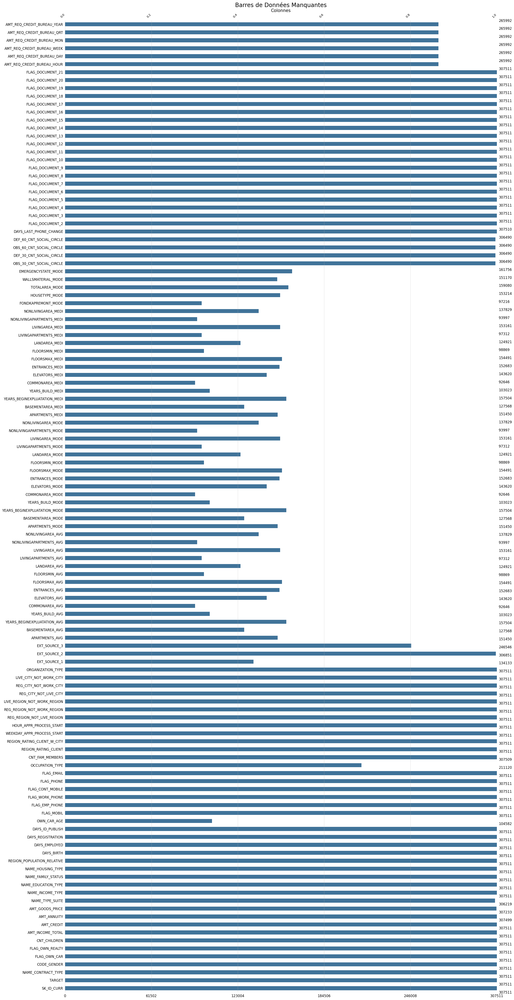

'Total des valeurs manquantes: 1404419'

SK_ID_CURR                       0
NAME_CONTRACT_TYPE               0
CODE_GENDER                      0
FLAG_OWN_CAR                     0
FLAG_OWN_REALTY                  0
                              ... 
AMT_REQ_CREDIT_BUREAU_DAY     6049
AMT_REQ_CREDIT_BUREAU_WEEK    6049
AMT_REQ_CREDIT_BUREAU_MON     6049
AMT_REQ_CREDIT_BUREAU_QRT     6049
AMT_REQ_CREDIT_BUREAU_YEAR    6049
Length: 121, dtype: int64

'----------------------------------------------------------------------------------------------------'

'Total des duplicatas (lignes identiques) dans le DataFrame: 0'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,Valeurs manquantes,% du total des valeurs
COMMONAREA_MODE,33495,68.70
COMMONAREA_MEDI,33495,68.70
COMMONAREA_AVG,33495,68.70
NONLIVINGAPARTMENTS_MEDI,33347,68.40
NONLIVINGAPARTMENTS_AVG,33347,68.40
NONLIVINGAPARTMENTS_MODE,33347,68.40
FONDKAPREMONT_MODE,32797,67.30
LIVINGAPARTMENTS_MODE,32780,67.20
LIVINGAPARTMENTS_MEDI,32780,67.20
LIVINGAPARTMENTS_AVG,32780,67.20


'Nombre de valeurs uniques dans chaque colonne :'

'SK_ID_CURR: 48744'

'NAME_CONTRACT_TYPE: 2'

'CODE_GENDER: 2'

'FLAG_OWN_CAR: 2'

'FLAG_OWN_REALTY: 2'

'CNT_CHILDREN: 11'

'AMT_INCOME_TOTAL: 606'

'AMT_CREDIT: 2937'

'AMT_ANNUITY: 7491'

'AMT_GOODS_PRICE: 677'

'NAME_TYPE_SUITE: 7'

'NAME_INCOME_TYPE: 7'

'NAME_EDUCATION_TYPE: 5'

'NAME_FAMILY_STATUS: 5'

'NAME_HOUSING_TYPE: 6'

'REGION_POPULATION_RELATIVE: 81'

'DAYS_BIRTH: 15477'

'DAYS_EMPLOYED: 7863'

'DAYS_REGISTRATION: 12618'

'DAYS_ID_PUBLISH: 5880'

'OWN_CAR_AGE: 52'

'FLAG_MOBIL: 2'

'FLAG_EMP_PHONE: 2'

'FLAG_WORK_PHONE: 2'

'FLAG_CONT_MOBILE: 2'

'FLAG_PHONE: 2'

'FLAG_EMAIL: 2'

'OCCUPATION_TYPE: 18'

'CNT_FAM_MEMBERS: 12'

'REGION_RATING_CLIENT: 3'

'REGION_RATING_CLIENT_W_CITY: 4'

'WEEKDAY_APPR_PROCESS_START: 7'

'HOUR_APPR_PROCESS_START: 24'

'REG_REGION_NOT_LIVE_REGION: 2'

'REG_REGION_NOT_WORK_REGION: 2'

'LIVE_REGION_NOT_WORK_REGION: 2'

'REG_CITY_NOT_LIVE_CITY: 2'

'REG_CITY_NOT_WORK_CITY: 2'

'LIVE_CITY_NOT_WORK_CITY: 2'

'ORGANIZATION_TYPE: 58'

'EXT_SOURCE_1: 27207'

'EXT_SOURCE_2: 38885'

'EXT_SOURCE_3: 702'

'APARTMENTS_AVG: 1543'

'BASEMENTAREA_AVG: 2816'

'YEARS_BEGINEXPLUATATION_AVG: 175'

'YEARS_BUILD_AVG: 130'

'COMMONAREA_AVG: 2042'

'ELEVATORS_AVG: 181'

'ENTRANCES_AVG: 200'

'FLOORSMAX_AVG: 252'

'FLOORSMIN_AVG: 198'

'LANDAREA_AVG: 2540'

'LIVINGAPARTMENTS_AVG: 1211'

'LIVINGAREA_AVG: 3848'

'NONLIVINGAPARTMENTS_AVG: 241'

'NONLIVINGAREA_AVG: 2026'

'APARTMENTS_MODE: 636'

'BASEMENTAREA_MODE: 2835'

'YEARS_BEGINEXPLUATATION_MODE: 160'

'YEARS_BUILD_MODE: 132'

'COMMONAREA_MODE: 2001'

'ELEVATORS_MODE: 26'

'ENTRANCES_MODE: 30'

'FLOORSMAX_MODE: 25'

'FLOORSMIN_MODE: 25'

'LANDAREA_MODE: 2560'

'LIVINGAPARTMENTS_MODE: 602'

'LIVINGAREA_MODE: 3842'

'NONLIVINGAPARTMENTS_MODE: 106'

'NONLIVINGAREA_MODE: 2025'

'APARTMENTS_MEDI: 918'

'BASEMENTAREA_MEDI: 2805'

'YEARS_BEGINEXPLUATATION_MEDI: 169'

'YEARS_BUILD_MEDI: 129'

'COMMONAREA_MEDI: 2034'

'ELEVATORS_MEDI: 43'

'ENTRANCES_MEDI: 43'

'FLOORSMAX_MEDI: 47'

'FLOORSMIN_MEDI: 44'

'LANDAREA_MEDI: 2562'

'LIVINGAPARTMENTS_MEDI: 843'

'LIVINGAREA_MEDI: 3885'

'NONLIVINGAPARTMENTS_MEDI: 134'

'NONLIVINGAREA_MEDI: 2030'

'FONDKAPREMONT_MODE: 4'

'HOUSETYPE_MODE: 3'

'TOTALAREA_MODE: 3820'

'WALLSMATERIAL_MODE: 7'

'EMERGENCYSTATE_MODE: 2'

'OBS_30_CNT_SOCIAL_CIRCLE: 28'

'DEF_30_CNT_SOCIAL_CIRCLE: 8'

'OBS_60_CNT_SOCIAL_CIRCLE: 27'

'DEF_60_CNT_SOCIAL_CIRCLE: 7'

'DAYS_LAST_PHONE_CHANGE: 3579'

'FLAG_DOCUMENT_2: 1'

'FLAG_DOCUMENT_3: 2'

'FLAG_DOCUMENT_4: 2'

'FLAG_DOCUMENT_5: 2'

'FLAG_DOCUMENT_6: 2'

'FLAG_DOCUMENT_7: 2'

'FLAG_DOCUMENT_8: 2'

'FLAG_DOCUMENT_9: 2'

'FLAG_DOCUMENT_10: 1'

'FLAG_DOCUMENT_11: 2'

'FLAG_DOCUMENT_12: 1'

'FLAG_DOCUMENT_13: 1'

'FLAG_DOCUMENT_14: 1'

'FLAG_DOCUMENT_15: 1'

'FLAG_DOCUMENT_16: 1'

'FLAG_DOCUMENT_17: 1'

'FLAG_DOCUMENT_18: 2'

'FLAG_DOCUMENT_19: 1'

'FLAG_DOCUMENT_20: 1'

'FLAG_DOCUMENT_21: 1'

'AMT_REQ_CREDIT_BUREAU_HOUR: 3'

'AMT_REQ_CREDIT_BUREAU_DAY: 3'

'AMT_REQ_CREDIT_BUREAU_WEEK: 3'

'AMT_REQ_CREDIT_BUREAU_MON: 7'

'AMT_REQ_CREDIT_BUREAU_QRT: 8'

'AMT_REQ_CREDIT_BUREAU_YEAR: 16'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

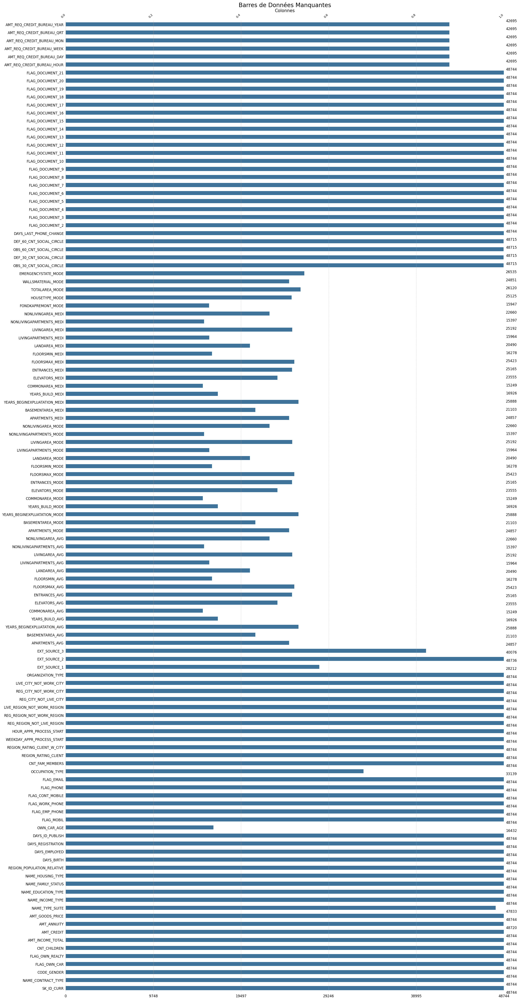

'Total des valeurs manquantes: 3939947'

SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64

'----------------------------------------------------------------------------------------------------'

'Total des duplicatas (lignes identiques) dans le DataFrame: 0'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,Valeurs manquantes,% du total des valeurs
AMT_ANNUITY,1226791,71.50
AMT_CREDIT_MAX_OVERDUE,1124488,65.50
DAYS_ENDDATE_FACT,633653,36.90
AMT_CREDIT_SUM_LIMIT,591780,34.50
AMT_CREDIT_SUM_DEBT,257669,15.00
DAYS_CREDIT_ENDDATE,105553,6.10
AMT_CREDIT_SUM,13,0.00


'Nombre de valeurs uniques dans chaque colonne :'

'SK_ID_CURR: 305811'

'SK_ID_BUREAU: 1716428'

'CREDIT_ACTIVE: 4'

'CREDIT_CURRENCY: 4'

'DAYS_CREDIT: 2923'

'CREDIT_DAY_OVERDUE: 942'

'DAYS_CREDIT_ENDDATE: 14096'

'DAYS_ENDDATE_FACT: 2917'

'AMT_CREDIT_MAX_OVERDUE: 68251'

'CNT_CREDIT_PROLONG: 10'

'AMT_CREDIT_SUM: 236708'

'AMT_CREDIT_SUM_DEBT: 226537'

'AMT_CREDIT_SUM_LIMIT: 51726'

'AMT_CREDIT_SUM_OVERDUE: 1616'

'CREDIT_TYPE: 15'

'DAYS_CREDIT_UPDATE: 2982'

'AMT_ANNUITY: 40321'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

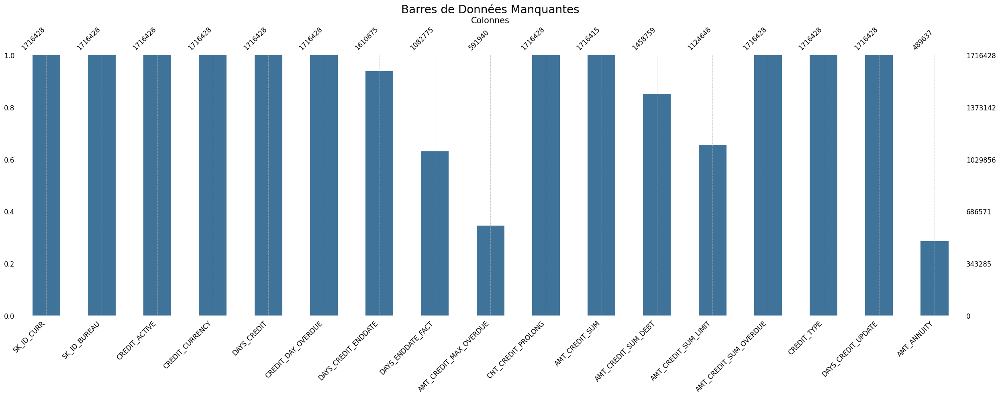

'Total des valeurs manquantes: 0'

SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

'----------------------------------------------------------------------------------------------------'

'Total des duplicatas (lignes identiques) dans le DataFrame: 0'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,Valeurs manquantes,% du total des valeurs


'Nombre de valeurs uniques dans chaque colonne :'

'SK_ID_BUREAU: 817395'

'MONTHS_BALANCE: 97'

'STATUS: 8'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

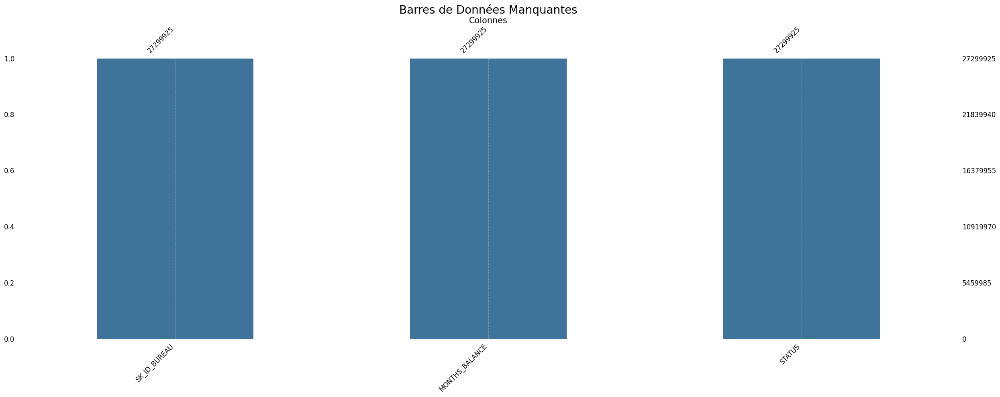

'Total des valeurs manquantes: 11109336'

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

'----------------------------------------------------------------------------------------------------'

'Total des duplicatas (lignes identiques) dans le DataFrame: 0'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,Valeurs manquantes,% du total des valeurs
RATE_INTEREST_PRIMARY,1664263,99.60
RATE_INTEREST_PRIVILEGED,1664263,99.60
AMT_DOWN_PAYMENT,895844,53.60
RATE_DOWN_PAYMENT,895844,53.60
NAME_TYPE_SUITE,820405,49.10
DAYS_FIRST_DRAWING,673065,40.30
DAYS_FIRST_DUE,673065,40.30
DAYS_LAST_DUE_1ST_VERSION,673065,40.30
DAYS_LAST_DUE,673065,40.30
DAYS_TERMINATION,673065,40.30


'Nombre de valeurs uniques dans chaque colonne :'

'SK_ID_PREV: 1670214'

'SK_ID_CURR: 338857'

'NAME_CONTRACT_TYPE: 4'

'AMT_ANNUITY: 357959'

'AMT_APPLICATION: 93885'

'AMT_CREDIT: 86803'

'AMT_DOWN_PAYMENT: 29278'

'AMT_GOODS_PRICE: 93885'

'WEEKDAY_APPR_PROCESS_START: 7'

'HOUR_APPR_PROCESS_START: 24'

'FLAG_LAST_APPL_PER_CONTRACT: 2'

'NFLAG_LAST_APPL_IN_DAY: 2'

'RATE_DOWN_PAYMENT: 207033'

'RATE_INTEREST_PRIMARY: 148'

'RATE_INTEREST_PRIVILEGED: 25'

'NAME_CASH_LOAN_PURPOSE: 25'

'NAME_CONTRACT_STATUS: 4'

'DAYS_DECISION: 2922'

'NAME_PAYMENT_TYPE: 4'

'CODE_REJECT_REASON: 9'

'NAME_TYPE_SUITE: 7'

'NAME_CLIENT_TYPE: 4'

'NAME_GOODS_CATEGORY: 28'

'NAME_PORTFOLIO: 5'

'NAME_PRODUCT_TYPE: 3'

'CHANNEL_TYPE: 8'

'SELLERPLACE_AREA: 2097'

'NAME_SELLER_INDUSTRY: 11'

'CNT_PAYMENT: 49'

'NAME_YIELD_GROUP: 5'

'PRODUCT_COMBINATION: 17'

'DAYS_FIRST_DRAWING: 2838'

'DAYS_FIRST_DUE: 2892'

'DAYS_LAST_DUE_1ST_VERSION: 4605'

'DAYS_LAST_DUE: 2873'

'DAYS_TERMINATION: 2830'

'NFLAG_INSURED_ON_APPROVAL: 2'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

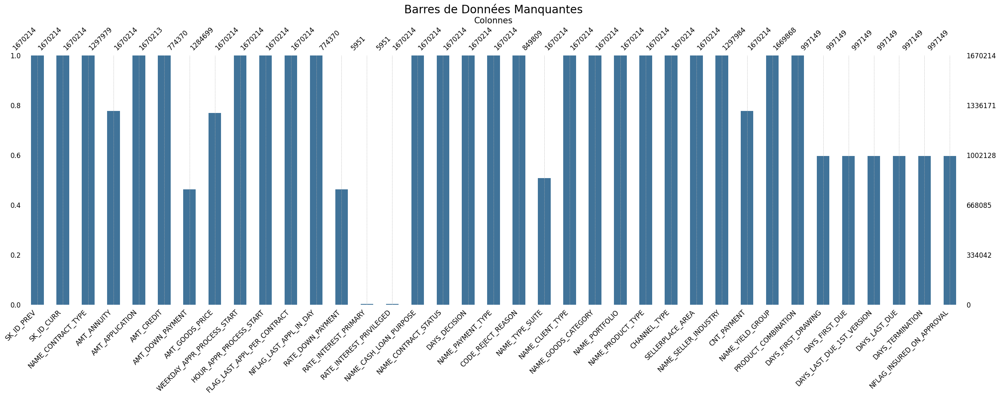

'Total des valeurs manquantes: 52158'

SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
dtype: int64

'----------------------------------------------------------------------------------------------------'

'Total des duplicatas (lignes identiques) dans le DataFrame: 0'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,Valeurs manquantes,% du total des valeurs
CNT_INSTALMENT_FUTURE,26087,0.30
CNT_INSTALMENT,26071,0.30


'Nombre de valeurs uniques dans chaque colonne :'

'SK_ID_PREV: 936325'

'SK_ID_CURR: 337252'

'MONTHS_BALANCE: 96'

'CNT_INSTALMENT: 73'

'CNT_INSTALMENT_FUTURE: 79'

'NAME_CONTRACT_STATUS: 9'

'SK_DPD: 3400'

'SK_DPD_DEF: 2307'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

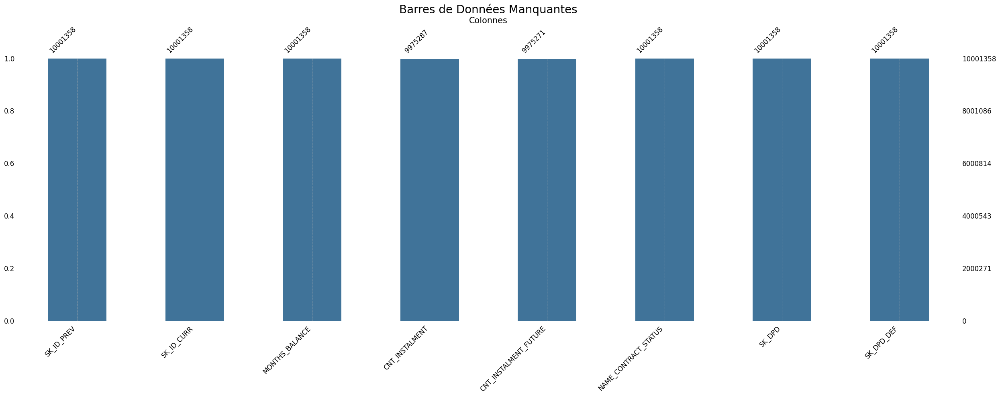

'Total des valeurs manquantes: 5810'

SK_ID_PREV                   0
SK_ID_CURR                   0
NUM_INSTALMENT_VERSION       0
NUM_INSTALMENT_NUMBER        0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT        2905
AMT_INSTALMENT               0
AMT_PAYMENT               2905
dtype: int64

'----------------------------------------------------------------------------------------------------'

'Total des duplicatas (lignes identiques) dans le DataFrame: 0'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,Valeurs manquantes,% du total des valeurs
DAYS_ENTRY_PAYMENT,2905,0.00
AMT_PAYMENT,2905,0.00


'Nombre de valeurs uniques dans chaque colonne :'

'SK_ID_PREV: 997752'

'SK_ID_CURR: 339587'

'NUM_INSTALMENT_VERSION: 65'

'NUM_INSTALMENT_NUMBER: 277'

'DAYS_INSTALMENT: 2922'

'DAYS_ENTRY_PAYMENT: 3039'

'AMT_INSTALMENT: 902539'

'AMT_PAYMENT: 944235'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

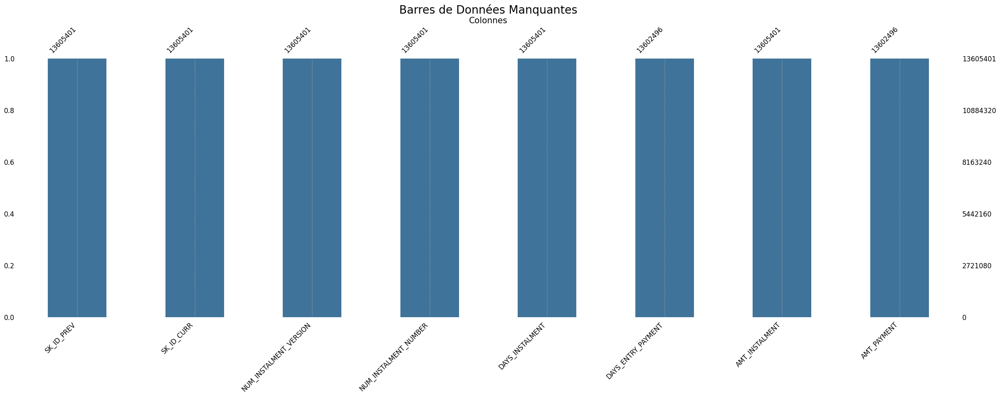

'Total des valeurs manquantes: 5877356'

SK_ID_PREV                         0
SK_ID_CURR                         0
MONTHS_BALANCE                     0
AMT_BALANCE                        0
AMT_CREDIT_LIMIT_ACTUAL            0
AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_CURRENT               0
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
AMT_PAYMENT_CURRENT           767988
AMT_PAYMENT_TOTAL_CURRENT          0
AMT_RECEIVABLE_PRINCIPAL           0
AMT_RECIVABLE                      0
AMT_TOTAL_RECEIVABLE               0
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_CURRENT               0
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
CNT_INSTALMENT_MATURE_CUM     305236
NAME_CONTRACT_STATUS               0
SK_DPD                             0
SK_DPD_DEF                         0
dtype: int64

'----------------------------------------------------------------------------------------------------'

'Total des duplicatas (lignes identiques) dans le DataFrame: 0'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

,Valeurs manquantes,% du total des valeurs
AMT_PAYMENT_CURRENT,767988,20.00
AMT_DRAWINGS_ATM_CURRENT,749816,19.50
AMT_DRAWINGS_OTHER_CURRENT,749816,19.50
AMT_DRAWINGS_POS_CURRENT,749816,19.50
CNT_DRAWINGS_ATM_CURRENT,749816,19.50
CNT_DRAWINGS_OTHER_CURRENT,749816,19.50
CNT_DRAWINGS_POS_CURRENT,749816,19.50
AMT_INST_MIN_REGULARITY,305236,7.90
CNT_INSTALMENT_MATURE_CUM,305236,7.90


'Nombre de valeurs uniques dans chaque colonne :'

'SK_ID_PREV: 104307'

'SK_ID_CURR: 103558'

'MONTHS_BALANCE: 96'

'AMT_BALANCE: 1347904'

'AMT_CREDIT_LIMIT_ACTUAL: 181'

'AMT_DRAWINGS_ATM_CURRENT: 2267'

'AMT_DRAWINGS_CURRENT: 187005'

'AMT_DRAWINGS_OTHER_CURRENT: 1832'

'AMT_DRAWINGS_POS_CURRENT: 168748'

'AMT_INST_MIN_REGULARITY: 312266'

'AMT_PAYMENT_CURRENT: 163209'

'AMT_PAYMENT_TOTAL_CURRENT: 182957'

'AMT_RECEIVABLE_PRINCIPAL: 1195839'

'AMT_RECIVABLE: 1338878'

'AMT_TOTAL_RECEIVABLE: 1339008'

'CNT_DRAWINGS_ATM_CURRENT: 44'

'CNT_DRAWINGS_CURRENT: 129'

'CNT_DRAWINGS_OTHER_CURRENT: 11'

'CNT_DRAWINGS_POS_CURRENT: 133'

'CNT_INSTALMENT_MATURE_CUM: 121'

'NAME_CONTRACT_STATUS: 7'

'SK_DPD: 917'

'SK_DPD_DEF: 378'

'----------------------------------------------------------------------------------------------------'

'----------------------------------------------------------------------------------------------------'

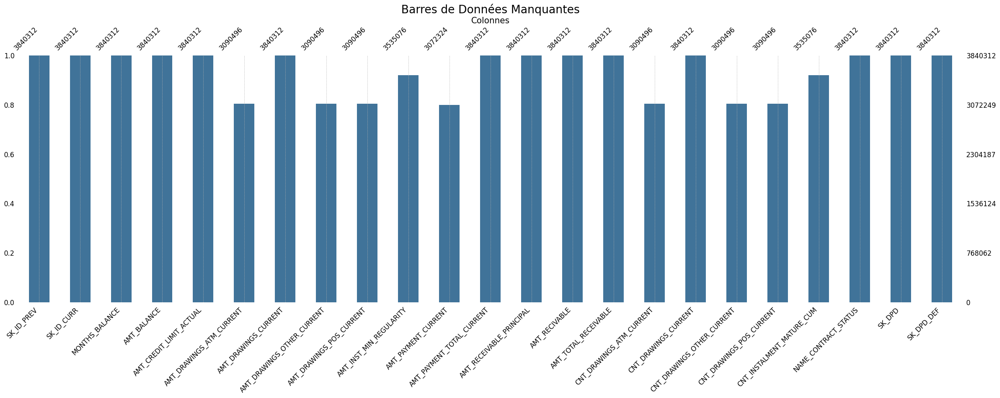

In [74]:
for name, df in df_l.items():
    display(HTML(f'<h2 style="color: green;">{name.upper()}</h2>'))
    missing_values_df(df)

* Analyse des Valeurs Manquantes pour Chaque Table de Données

** APPLICATION_TRAIN
- Total des valeurs manquantes: 3,811,016.
- Colonnes avec le plus de valeurs manquantes: Les colonnes liées aux demandes de crédit auprès des bureaux de crédit (AMT_REQ_CREDIT_BUREAU_*) ont toutes 17,213 valeurs manquantes.
- Duplicatas: Aucune ligne dupliquée.
- Valeurs uniques: Une grande variété de valeurs uniques dans presque toutes les colonnes, indiquant une diversité dans les données des demandeurs.

** APPLICATION_TEST 
- Total des valeurs manquantes: 1,404,419.
- Colonnes avec le plus de valeurs manquantes: Comme pour APPLICATION_TRAIN, les colonnes AMT_REQ_CREDIT_BUREAU_* présentent chacune 6,049 valeurs manquantes.
- Duplicatas: Aucune ligne dupliquée.
- Valeurs uniques: Moins de diversité comparée à APPLICATION_TRAIN, mais toujours significative.

** BUREAU
- Total des valeurs manquantes: 1,617,990.
- Colonnes avec le plus de valeurs manquantes: AMT_CREDIT_MAX_OVERDUE (467,164), AMT_ANNUITY (491,848), et DAYS_ENDDATE_FACT (262,231).
- Duplicatas: Aucune ligne dupliquée.
- Valeurs uniques: Grande diversité, en particulier dans SK_ID_BUREAU et AMT_CREDIT_SUM.

** BUREAU_BALANCE
- Total des valeurs manquantes: 1.
- Colonnes avec le plus de valeurs manquantes: Seulement une valeur manquante dans STATUS.
- Duplicatas: Aucune ligne dupliquée.
- Valeurs uniques: Variété modérée dans MONTHS_BALANCE et STATUS.

** PREVIOUS_APPLICATION
- Total des valeurs manquantes: 1,888,541.
- Colonnes avec le plus de valeurs manquantes: RATE_INTEREST_PRIMARY (287,205), RATE_INTEREST_PRIVILEGED (287,205), et plusieurs colonnes liées aux conditions de prêt.
- Duplicatas: Aucune ligne dupliquée.
- Valeurs uniques: Nombre élevé de valeurs uniques dans des colonnes comme AMT_ANNUITY et AMT_APPLICATION.

** POS_CASH_BALANCE
- Total des valeurs manquantes: 6,744.
- Colonnes avec le plus de valeurs manquantes: CNT_INSTALMENT_FUTURE (3,372) et CNT_INSTALMENT (3,369).
- Duplicatas: Aucune ligne dupliquée.
- Valeurs uniques: Nombreuses valeurs uniques dans SK_ID_PREV et SK_ID_CURR.

** INSTALLMENTS_PAYMENTS
- Total des valeurs manquantes: 1.
- Colonnes avec le plus de valeurs manquantes: Seulement une valeur manquante dans AMT_PAYMENT.
- Duplicatas: Aucune ligne dupliquée.
- Valeurs uniques: Nombre élevé de valeurs uniques dans des colonnes comme AMT_INSTALMENT et AMT_PAYMENT.

** CREDIT_CARD_BALANCE
- Total des valeurs manquantes: 1,016,596.
- Colonnes avec le plus de valeurs manquantes: AMT_DRAWINGS_ATM_CURRENT (131,735), AMT_DRAWINGS_OTHER_CURRENT (131,735), et 
AMT_DRAWINGS_POS_CURRENT (131,735).
- Duplicatas: Aucune ligne dupliquée.
- Valeurs uniques: Grande diversité dans des colonnes comme AMT_BALANCE et AMT_CREDIT_LIMIT_ACTUAL.

** Conclusion

APPLICATION_TRAIN et TEST 
- présentent des valeurs manquantes significatives dans les colonnes des demandes de crédit auprès des bureaux de crédit.
- BUREAU et PREVIOUS_APPLICATION ont des valeurs manquantes notables dans plusieurs colonnes, notamment celles liées aux montants et conditions de crédit.
- CREDIT_CARD_BALANCE a également un grand nombre de valeurs manquantes, en particulier dans les colonnes liées aux transactions
- La plupart des variables catégorielles dans le jeu de données présentent un nombre restreint d'entrées uniques. 


## Analyses Visuelles

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

def distribution_df(df):   
    cat_cols = df.select_dtypes(include=['object', 'category']).columns
    num_cols = df.select_dtypes(exclude=['object', 'category']).columns

    
    for col in cat_cols:
        plt.figure(figsize=(10, 4))
        sns.countplot(x=col, data=df)
        plt.title(f'Distribution de la variable catégorielle : {col}')
        plt.xticks(rotation=45)
        plt.show()

    for col in num_cols:
        plt.figure(figsize=(10, 4))
        sns.histplot(df[col], kde=True)
        plt.title(f'Distribution de la variable numérique : {col}')
        plt.show()


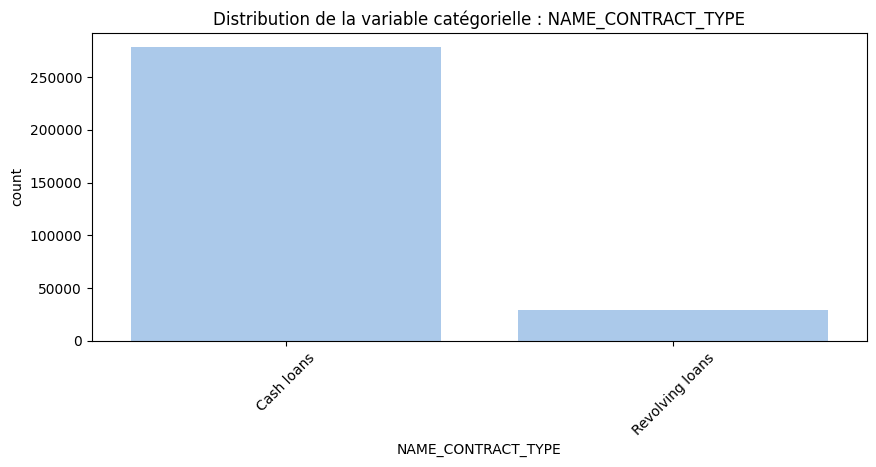

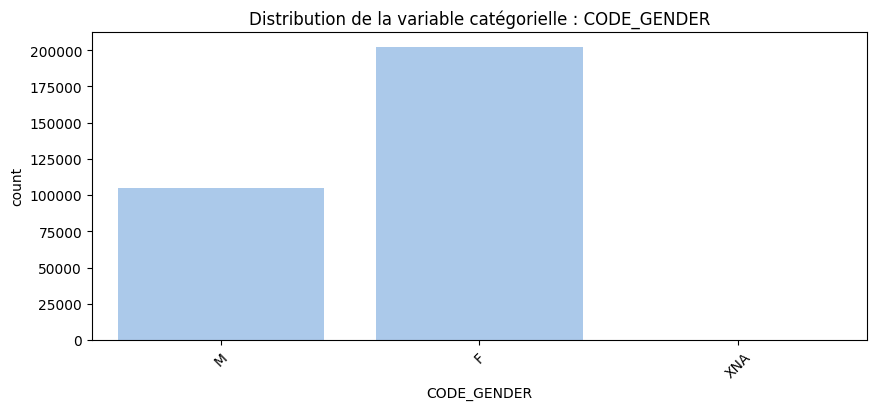

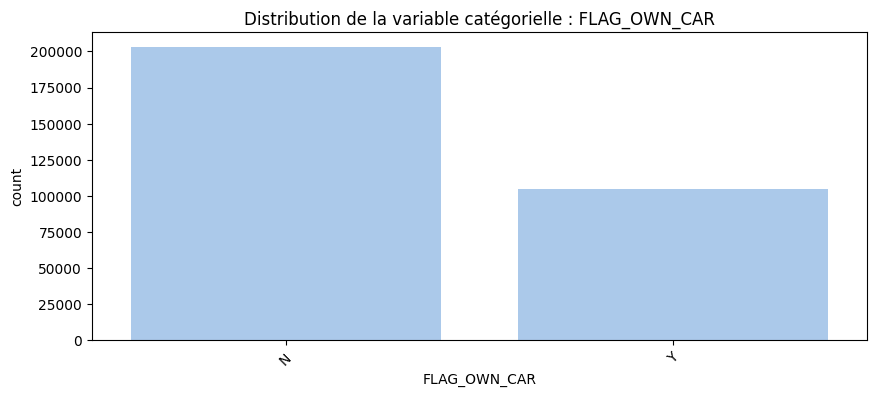

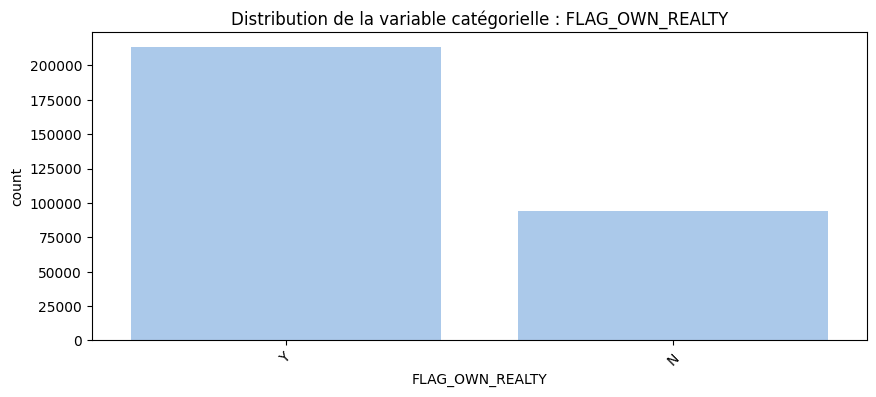

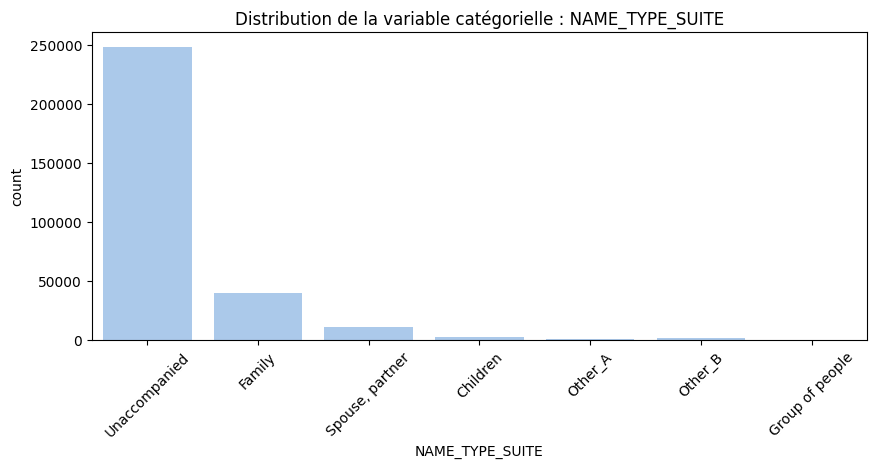

...

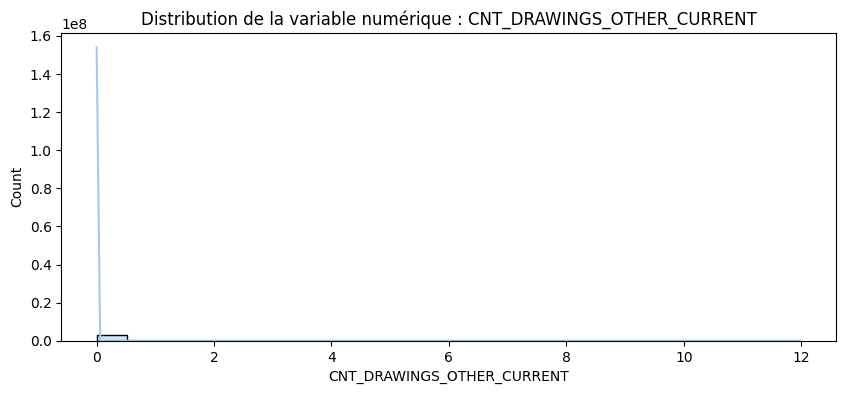

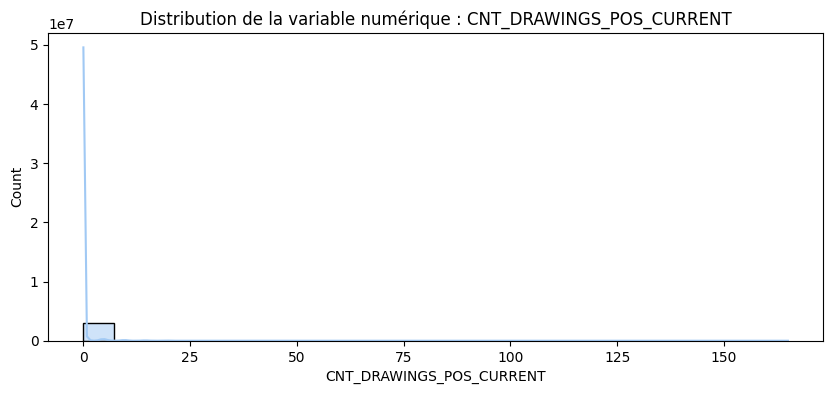

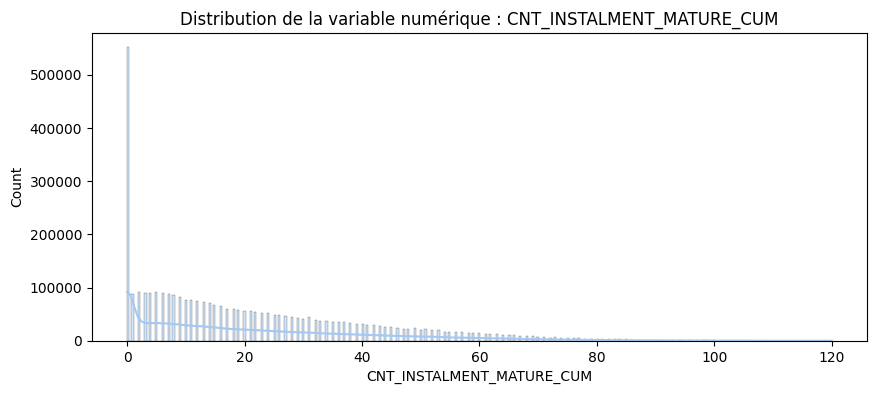

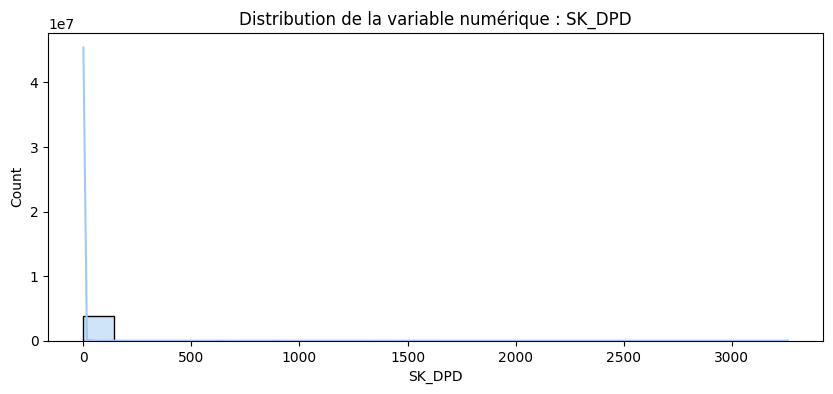

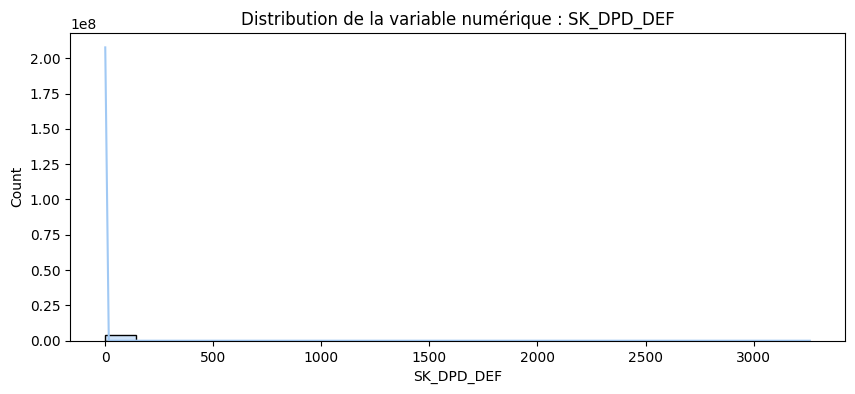

In [76]:
 for name, df in df_l.items():
     display(HTML(f'<h2 style="color: green;">{name.upper()}</h2>'))
     distribution_df(df) 

### Examiner la distribution de la colonne cible

- Examiner la distribution de la colonne cible.
- La cible est ce que je suis invité à prédire : soit un 0 si le prêt a été remboursé à temps, soit un 1 indiquant que le client a eu des difficultés de paiement. 
- Je veux d'abord examiner le nombre de prêts relevant de chaque catégorie.

In [77]:
df_app_train = df_l['application_train'].copy()
df_app_train['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

In [78]:
df_app_train['TARGET'].value_counts()/len(df_app_train)*100

TARGET
0   91.93
1    8.07
Name: count, dtype: float64

In [79]:
df_app_test = df_l['application_test'].copy()

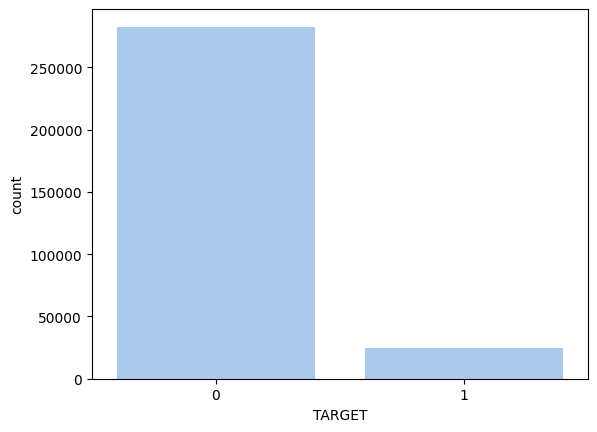

In [80]:
ax = sns.countplot(x="TARGET", data=df_app_train)

- Il y a un déséquilibre de classes. Il existe une majorité de prêts remboursés à temps par rapport à ceux en défaut de paiement.
- Dans les modèles d'apprentissage automatique avancés, il est possible d'ajuster les poids attribués à chaque classe selon leur fréquence dans l'ensemble des données, afin de tenir compte de ce déséquilibre.

### Examiner les types

<Axes: title={'center': 'Répartition des types de colonnes'}, ylabel='count'>

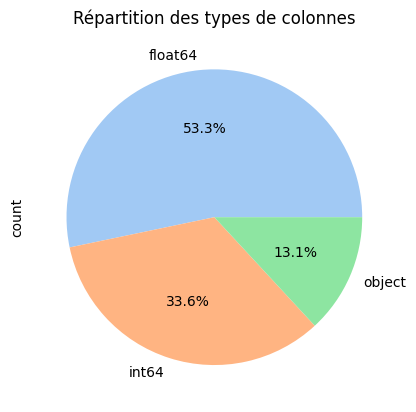

In [81]:
df_app_train.dtypes.value_counts().plot(kind='pie',autopct="%1.1f%%", title = "Répartition des types de colonnes")

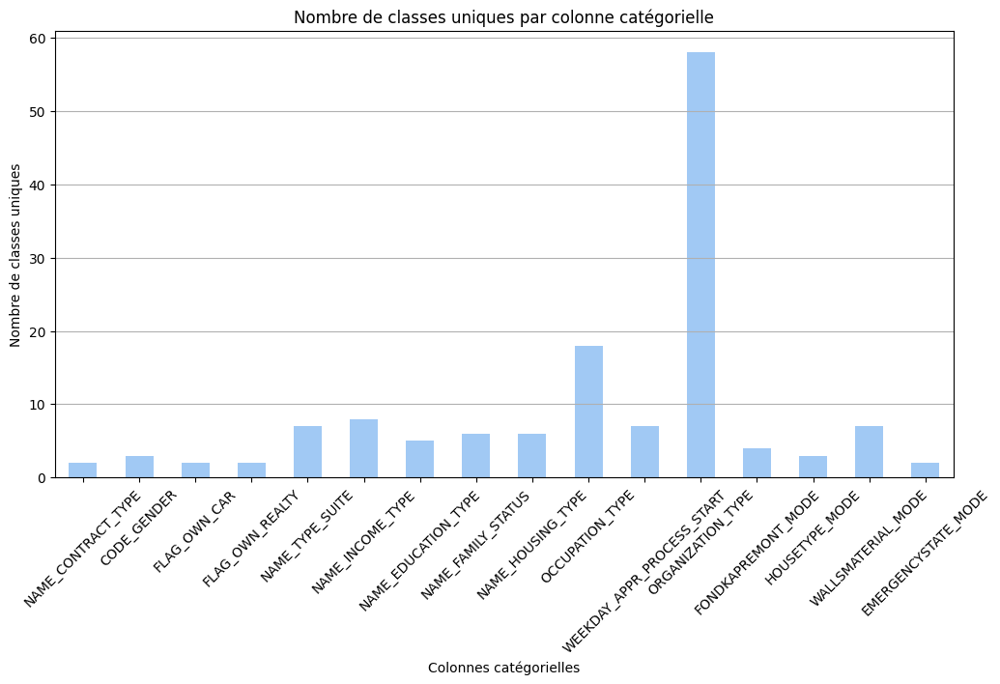

In [82]:
unique_counts = df_app_train.select_dtypes('object').apply(pd.Series.nunique, axis=0)

plt.figure(figsize=(12, 6))
unique_counts.plot(kind='bar')

plt.title("Nombre de classes uniques par colonne catégorielle")
plt.xlabel("Colonnes catégorielles")
plt.ylabel("Nombre de classes uniques")
plt.xticks(rotation=45)
plt.grid(axis='y')

plt.show()

- Types de données : L'ensemble de données app_train comporte 65 colonnes de type float64, 41 colonnes de type int64 et 16 colonnes de type object.
- Valeurs uniques : Les colonnes catégorielles (object) varient en termes de catégories uniques, avec un éventail allant de 2 à 58 catégories distinctes par colonne.
- La variété des types de données et la diversité des catégories uniques dans les variables catégorielles, justifie l'utilisation du codage "one-hot" ou "label encoding" est nécessaire pour préparer ces données en vue de l'application d'algorithmes d'apprentissage automatique.

## Encodage

- Utiliser l'encodage par label pour les variables avec seulement deux catégories 
- L'encodage one-hot pour celles avec plus de deux catégories.
- Après l'encodage, aligner les jeux de données d'entraînement et de test pour s'assurer qu'ils partagent les mêmes caractéristiques.
- Cette étape permet d'éviter des erreurs dans les modèles d'apprentissage automatique dus à des différences de structures entre les jeux de données.

In [83]:
le = LabelEncoder()
le_count = 0

for col in df_app_train:
    if df_app_train[col].dtype == 'object':
       
        if len(list(df_app_train[col].unique())) <= 2:
            
            le.fit(df_app_train[col])
           
            df_app_train[col] = le.transform(df_app_train[col])
            df_app_test[col] = le.transform(df_app_test[col])
            
           
            le_count += 1
            
print('%d  colonnes ont été encodées.' % le_count)

3  colonnes ont été encodées.


In [84]:
# one-hot encoding 
df_app_train = pd.get_dummies(df_app_train)
df_app_test = pd.get_dummies(df_app_test)

In [85]:
train_labels = df_app_train['TARGET']

# Sélectionner la colonne de la variable cible dans le dataframe d'entraînement
df_app_train, df_app_test = df_app_train.align(df_app_test, join = 'inner', axis = 1)

# Ajouter la variable cible
df_app_train['TARGET'] = train_labels

print('Dimension entrainement: ', df_app_train.shape)
print('Dimension test: ', df_app_test.shape)

Dimension entrainement:  (307511, 240)
Dimension test:  (48744, 239)


## Analyse des anomalies

count   842.50
mean    -43.94
std      11.96
min     -69.12
25%     -53.92
50%     -43.15
75%     -34.01
max     -20.52
Name: DAYS_BIRTH, dtype: float64

count   307,511.00
mean     63,815.05
std     141,275.77
min     -17,912.00
25%      -2,760.00
50%      -1,213.00
75%        -289.00
max     365,243.00
Name: DAYS_EMPLOYED, dtype: float64

'Anomalies - Taux de défaut : 5.40%'

'Non-anomalies - Taux de défaut : 8.66%'

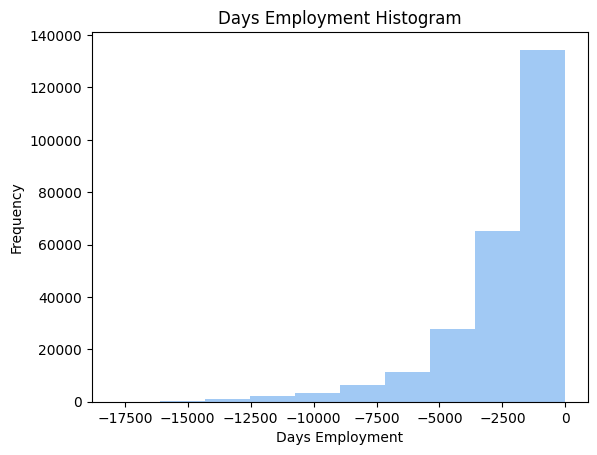

In [86]:
# Analyse de la variable 'DAYS_BIRTH'
#df_app_train['DAYS_BIRTH'] = abs(df_app_train['DAYS_BIRTH'])
display(df_app_train['DAYS_BIRTH'].describe() / 365)

# Analyse de la variable 'DAYS_EMPLOYED'
display(df_app_train['DAYS_EMPLOYED'].describe())

# On considère comme anomalie les valeurs de 'DAYS_EMPLOYED' égales à 365243 (environ 1000 ans).
anomalies = df_app_train[df_app_train['DAYS_EMPLOYED'] == 365243]
non_anomalies = df_app_train[df_app_train['DAYS_EMPLOYED'] != 365243]
display(f"Anomalies - Taux de défaut : {100 * anomalies['TARGET'].mean():.2f}%")
display(f"Non-anomalies - Taux de défaut : {100 * non_anomalies['TARGET'].mean():.2f}%")

# Traitement des anomalies
# Remplacer les valeurs anormales par NaN 
# Créer une colonne indiquant les anomalies.
# La variable 'DAYS_EMPLOYED' représente le nombre de jours depuis le début de l'emploi de l'emprunteur.  
df_app_train['DAYS_EMPLOYED_ANOM'] = df_app_train['DAYS_EMPLOYED'] == 365243
df_app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace=True)

# Répéter le processus pour les données de test
df_app_test['DAYS_EMPLOYED_ANOM'] = df_app_test['DAYS_EMPLOYED'] == 36524
df_app_test['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace=True)

df_app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

- La variable DAYS_BIRTH, qui représente l'âge du client en jours au moment de la demande de prêt, montre une distribution sans valeurs aberrantes. 
- En convertissant ces jours en années, l'âge moyen des clients est d'environ 44 ans, avec un minimum de 20,52 ans et un maximum de 69,12 ans
- La variable 'DAYS_EMPLOYED' a des valeurs extrêmement élevées qui semblent anormales.
- En remplaçant les valeurs d'emploi anormales par NaN, les clients ayant des données d'emploi normales ont un taux de défaut plus élevé (8.66%) que ceux avec des anomalies (5.40%). 
- Cette tendance souligne l'importance de traiter correctement ces anomalies dans le modèle.

## Corrélation 

- Analyse des corrélations et détection de Data Leakage.  

Cette section explore les corrélations entre nos caractéristiques (variables) et la variable cible 'TARGET'.  
Une forte corrélation entre une caractéristique et la cible peut indiquer une relation importante.  
On cherche a  éviter la  fuite de données (Data Leakage).  
**Data Leakage** : le modèle apprend involontairement à partir d'informations qui ne seraient pas disponibles en situation réelle.

- L'objectif est d'analyser les corrélations, d'identifier toute caractéristique potentiellement problématique, et de nous assurer que notre modèle est robuste contre la fuite de données.


In [87]:
#Trouver les corrélations avec la target et les trier
correlations = df_app_train.corr()['TARGET'].sort_values()
display('Les 15 plus importantes corrélations positives:', correlations.tail(15))
display('Les 15 plus importantes corrélations négatives:', correlations.head(15))
display('Les 10 plus importantes corrélations: ',(abs(correlations)).sort_values(ascending = False).head(10))

'Les 15 plus importantes corrélations positives:'

OCCUPATION_TYPE_Laborers                            0.04
FLAG_DOCUMENT_3                                     0.04
REG_CITY_NOT_LIVE_CITY                              0.04
FLAG_EMP_PHONE                                      0.05
NAME_EDUCATION_TYPE_Secondary / secondary special   0.05
REG_CITY_NOT_WORK_CITY                              0.05
DAYS_ID_PUBLISH                                     0.05
CODE_GENDER_M                                       0.05
DAYS_LAST_PHONE_CHANGE                              0.06
NAME_INCOME_TYPE_Working                            0.06
REGION_RATING_CLIENT                                0.06
REGION_RATING_CLIENT_W_CITY                         0.06
DAYS_EMPLOYED                                       0.07
DAYS_BIRTH                                          0.08
TARGET                                              1.00
Name: TARGET, dtype: float64

'Les 15 plus importantes corrélations négatives:'

EXT_SOURCE_3                           -0.18
EXT_SOURCE_2                           -0.16
EXT_SOURCE_1                           -0.16
NAME_EDUCATION_TYPE_Higher education   -0.06
CODE_GENDER_F                          -0.05
NAME_INCOME_TYPE_Pensioner             -0.05
DAYS_EMPLOYED_ANOM                     -0.05
ORGANIZATION_TYPE_XNA                  -0.05
FLOORSMAX_AVG                          -0.04
FLOORSMAX_MEDI                         -0.04
FLOORSMAX_MODE                         -0.04
EMERGENCYSTATE_MODE_No                 -0.04
HOUSETYPE_MODE_block of flats          -0.04
AMT_GOODS_PRICE                        -0.04
REGION_POPULATION_RELATIVE             -0.04
Name: TARGET, dtype: float64

'Les 10 plus importantes corrélations: '

TARGET                                 1.00
EXT_SOURCE_3                           0.18
EXT_SOURCE_2                           0.16
EXT_SOURCE_1                           0.16
DAYS_BIRTH                             0.08
DAYS_EMPLOYED                          0.07
REGION_RATING_CLIENT_W_CITY            0.06
REGION_RATING_CLIENT                   0.06
NAME_INCOME_TYPE_Working               0.06
NAME_EDUCATION_TYPE_Higher education   0.06
Name: TARGET, dtype: float64

- Les 3 facteurs numériques les plus influents sont issus de sources externes.
- Ensuite 'DAYS_BIRTH' et 'DAYS_EMPLOYED'.

- Le calcul des corrélations de Pearson entre chaque caractéristique et la cible identifie les relations potentielles. 

#### DAYS_BIRTH

In [88]:
app_train = df_app_train.copy()

# Trouver la corrélation entre les jours positifs depuis la naissance et la variable cible.
app_train['DAYS_BIRTH'] = abs(app_train['DAYS_BIRTH'])
app_train['DAYS_BIRTH'].corr(app_train['TARGET'])

-0.07823930830982712

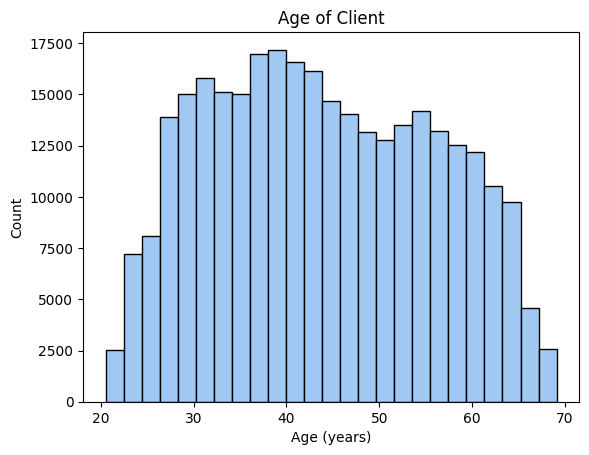

In [89]:
# Tracer la distribution des âges en années.
plt.hist(app_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

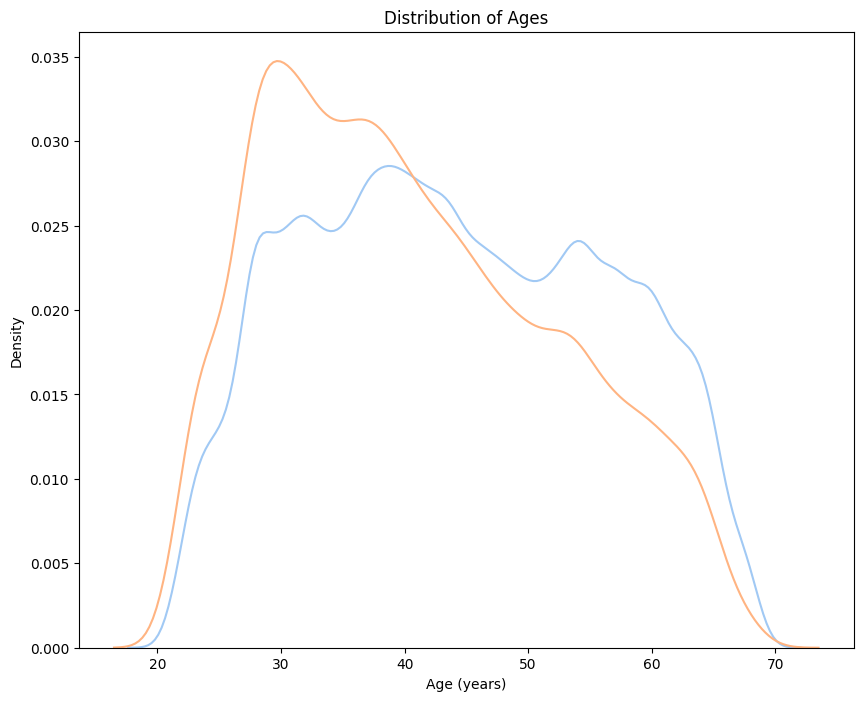

In [90]:
plt.figure(figsize = (10, 8))

# Tracé du KDE (Kernel Density Estimation) des prêts remboursés à temps
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# Tracé du KDE des prêts non remboursés à temps
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Libellé du graphique
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

In [91]:
# Information sur l'âge dans un dataframe séparé
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Regrouper les données d'âge
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.92,"(25.0, 30.0]"
1,0,16765,45.93,"(45.0, 50.0]"
2,0,19046,52.18,"(50.0, 55.0]"
3,0,19005,52.07,"(50.0, 55.0]"
4,0,19932,54.61,"(50.0, 55.0]"
5,0,16941,46.41,"(45.0, 50.0]"
6,0,13778,37.75,"(35.0, 40.0]"
7,0,18850,51.64,"(50.0, 55.0]"
8,0,20099,55.07,"(55.0, 60.0]"
9,0,14469,39.64,"(35.0, 40.0]"


In [92]:
# Regrouper par la tranche d'âge et calculer les moyennes
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.12,"8,532.80",23.38
"(25.0, 30.0]",0.11,"10,155.22",27.82
"(30.0, 35.0]",0.10,"11,854.85",32.48
"(35.0, 40.0]",0.09,"13,707.91",37.56
"(40.0, 45.0]",0.08,"15,497.66",42.46
"(45.0, 50.0]",0.07,"17,323.90",47.46
"(50.0, 55.0]",0.07,"19,196.49",52.59
"(55.0, 60.0]",0.06,"20,984.26",57.49
"(60.0, 65.0]",0.05,"22,780.55",62.41


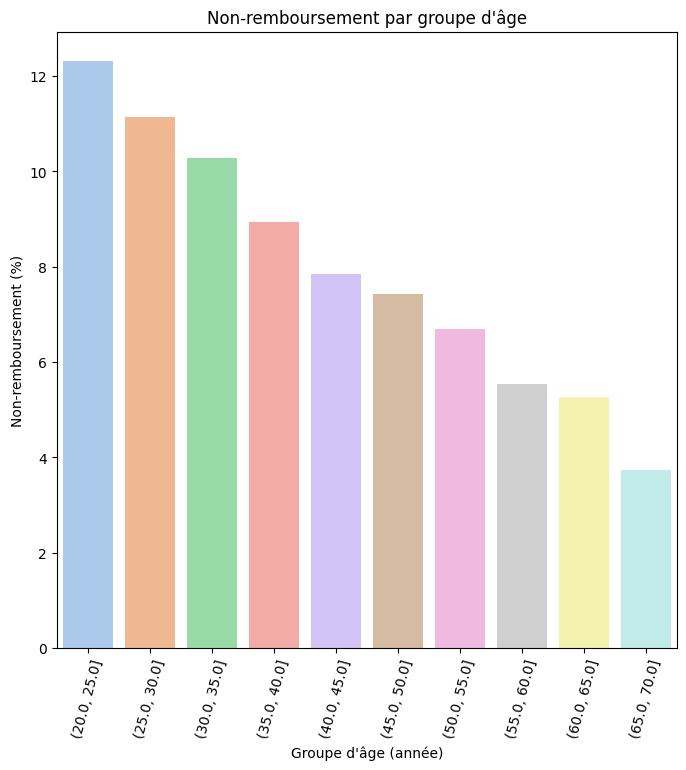

In [93]:
colors = sns.color_palette('pastel')[0:10]


plt.figure(figsize=(8, 8))
sns.barplot(x=age_groups.index.astype(str), y=100 * age_groups['TARGET'], palette=colors)

plt.xticks(rotation=75)
plt.xlabel('Groupe d\'âge (année)')
plt.ylabel('Non-remboursement (%)')
plt.title('Non-remboursement par groupe d\'âge')

# Affichage du graphique
plt.show()

-  Le risque de défaut de paiement augmente à mesure que l'âge des clients diminue

#### DAYS_EMPLOYED

In [94]:
df_emp = app_train[['TARGET', 'DAYS_EMPLOYED']].copy()
df_emp['YEARS_EMP'] = df_emp['DAYS_EMPLOYED']/-365
df_emp['Tranche_age'] = pd.cut(df_emp['YEARS_EMP'], bins = np.linspace(0, 50, num = 11))
df_emp.head()

,TARGET,DAYS_EMPLOYED,YEARS_EMP,Tranche_age
0,1,-637.00,1.75,"(0.0, 5.0]"
1,0,"-1,188.00",3.25,"(0.0, 5.0]"
2,0,-225.00,0.62,"(0.0, 5.0]"
3,0,"-3,039.00",8.33,"(5.0, 10.0]"
4,0,"-3,038.00",8.32,"(5.0, 10.0]"


In [95]:
emp_groupe = df_emp.groupby('Tranche_age').mean()
emp_groupe

,TARGET,DAYS_EMPLOYED,YEARS_EMP
Tranche_age,,,
"(0.0, 5.0]",0.11,-864.34,2.37
"(5.0, 10.0]",0.07,"-2,630.22",7.21
"(10.0, 15.0]",0.06,"-4,466.90",12.24
"(15.0, 20.0]",0.05,"-6,306.86",17.28
"(20.0, 25.0]",0.05,"-8,092.88",22.17
"(25.0, 30.0]",0.04,"-9,961.44",27.29
"(30.0, 35.0]",0.04,"-11,791.75",32.31
"(35.0, 40.0]",0.02,"-13,517.63",37.03
"(40.0, 45.0]",0.00,"-15,325.46",41.99


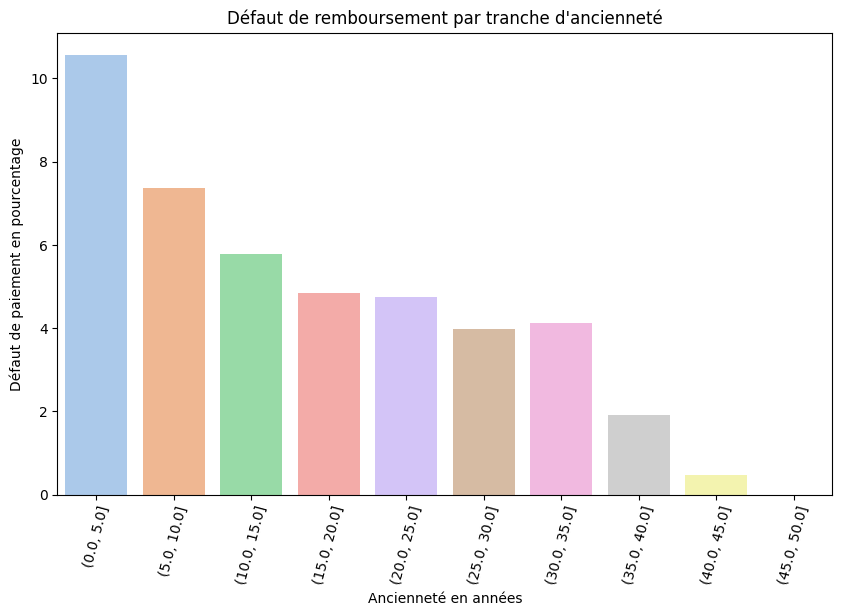

In [96]:
plt.figure(figsize=(10, 6))
sns.barplot(x=emp_groupe.index.astype(str), y=emp_groupe['TARGET'] * 100, palette=colors)

# Ajout de titres et d'étiquettes
plt.title('Défaut de remboursement par tranche d\'ancienneté')
plt.xlabel('Ancienneté en années')
plt.ylabel('Défaut de paiement en pourcentage')
plt.xticks(rotation=75)

plt.show()

Plus un client est ancien dans son emploi, moins il y a de risques de défaut de paiement. 

####  EXT_SOURCE

In [97]:
#  Extraire les variables EXT_SOURCE et afficher les corrélations
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.00,-0.16,-0.16,-0.18,-0.08
EXT_SOURCE_1,-0.16,1.00,0.21,0.19,0.60
EXT_SOURCE_2,-0.16,0.21,1.00,0.11,0.09
EXT_SOURCE_3,-0.18,0.19,0.11,1.00,0.21
DAYS_BIRTH,-0.08,0.60,0.09,0.21,1.00


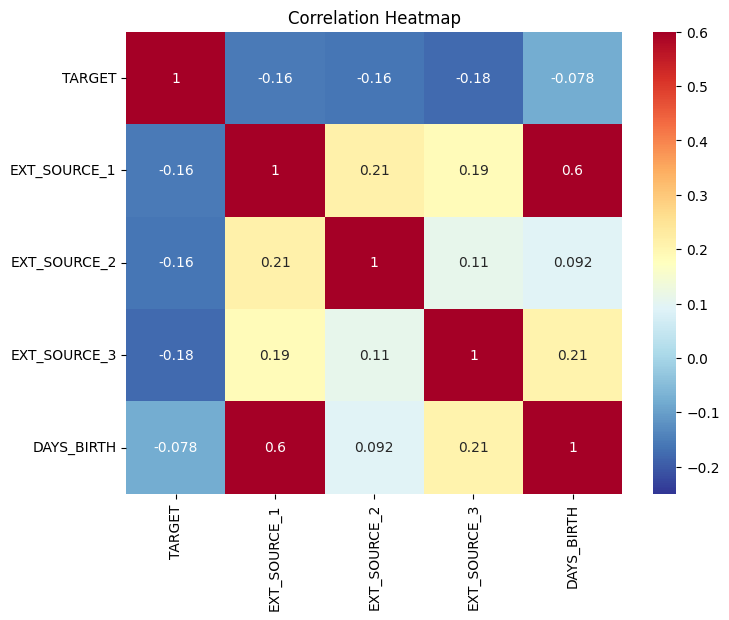

In [98]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

- Les caractéristiques EXT_SOURCE 1, 2 et 3 sont négativement corrélées avec la cible, indiquant qu'une valeur élevée de EXT_SOURCE augmente la probabilité de remboursement du prêt par le client. 
- Par ailleurs, une corrélation positive est observée entre DAYS_BIRTH et EXT_SOURCE_1, ce qui suggère que l'âge du client pourrait influencer ce score. 
- L'analyse de la distribution de ces caractéristiques, en fonction de la cible, permet de mieux comprendre leur impact sur la probabilité de remboursement du prêt.

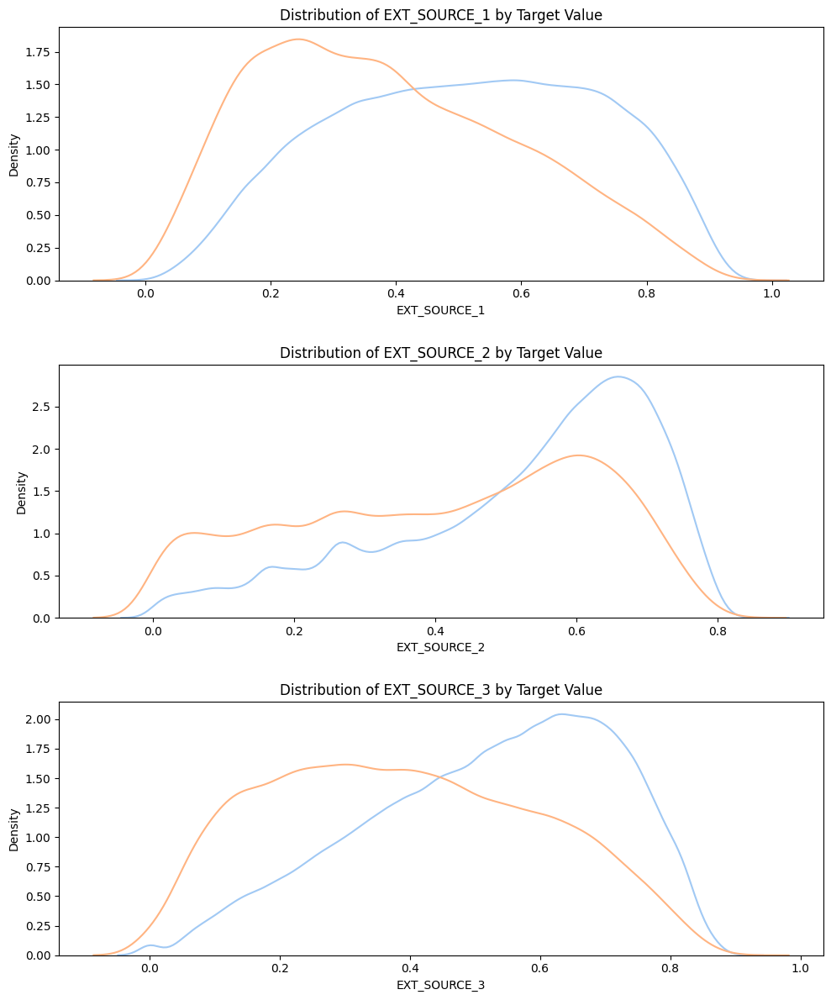

In [99]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, source], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

## Conclusion 

La variable cible : 

0 signifie que le crédit a été remboursé,
1 indique que le crédit n'a pas été remboursé.


Il s'agit d'un problème de classification binaire. 

- Il est important de noter que la variable cible est déséquilibrée. 
- Un poids aux classes sera attribué durant l'apprentissage pour contrebalancer le déséquilibre (par exemple, en utilisant le paramètre 'scale_pos_weight' dans XGBoost ou LightGBM).

# Feature engineering

- Le pré-traitement des données est basé sur le travail de jsaguiar disponible à l'adresse suivante : https://www.kaggle.com/jsaguiar/lightgbm-with-simple-features

 - lecture de fichiers CSV,
 - le nettoyage des données, 
 - l'encodage des variables catégorielles, 
 - l'agrégation d'informations, et la création de nouvelles caractéristiques. 

In [100]:
# gestionnaire de contexte qui mesure le temps d'exécution
@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

# encodage one-hot des variables catégorielles dans un DataFrame
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

#  lit, prétraite et fusionne les données des fichiers "application_train.csv".
def application_train(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    display("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    #df = pd.concat([df, test_df], ignore_index=True).reset_index(drop=True, inplace=True)
    df = pd.concat([df,test_df], ignore_index=True)
    
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df


#  traite les données des fichiers "bureau.csv" et "bureau_balance.csv" en effectuant des agrégations et en créant de nouvelles caractéristiques.
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

#  Traite les données du fichier "previous_application.csv" en effectuant des agrégations et en créant de nouvelles caractéristiques.
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

#  Traite les données du fichier "POS_CASH_balance.csv" en effectuant des agrégations et en créant de nouvelles caractéristiques.
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    

# Traite les données du fichier "installments_payments.csv" en effectuant des agrégations et en créant de nouvelles caractéristiques.
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Traite les données du fichier "credit_card_balance.csv" en effectuant des agrégations et en créant de nouvelles caractéristiques.
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

### Merge

In [101]:
def main (): 
    #num_rows = 100000
    num_rows = None

    df = application_train(num_rows)
    
    bureau = bureau_and_balance(num_rows)
    display("Bureau df shape:", bureau.shape)
    df = df.join(bureau, how='left', on='SK_ID_CURR')
    del bureau
    gc.collect()
   
    prev = previous_applications(num_rows)
    display("Previous applications df shape:", prev.shape)
    df = df.join(prev, how='left', on='SK_ID_CURR')
    del prev
    gc.collect()
    
    pos = pos_cash(num_rows)
    display("Pos-cash balance df shape:", pos.shape)
    df = df.join(pos, how='left', on='SK_ID_CURR')
    del pos
    gc.collect()    
   
    ins = installments_payments(num_rows)
    display("Installments payments df shape:", ins.shape)
    df = df.join(ins, how='left', on='SK_ID_CURR')
    del ins
    gc.collect()
    
    cc = credit_card_balance(num_rows)
    display("Credit card balance df shape:", cc.shape)
    df = df.join(cc, how='left', on='SK_ID_CURR')
    del cc
    gc.collect()
        
    df.to_csv("df_merge.csv")
    
    return df

In [ ]:
df = main()

'Train samples: 307511, test samples: 48744'

In [ ]:
df.head(5)

In [ ]:
# Réduire l'utilisation de la mémoire d'un dataframe en ajustant les types de données.
def reduire_utilisation_memoire(df):   
    memoire_debut = df.memory_usage(deep=True).sum() / 1024**2
    print('Utilisation de la mémoire du dataframe au départ : {:.2f} Mo'.format(memoire_debut))
    
    for col in df.columns:
        type_col = df[col].dtype
        
        if type_col != object and type_col != 'category':
            min_col = df[col].min()
            max_col = df[col].max()
            if str(type_col)[:3] == 'int':
                if min_col > np.iinfo(np.int8).min and max_col < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif min_col > np.iinfo(np.int16).min and max_col < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif min_col > np.iinfo(np.int32).min and max_col < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif min_col > np.iinfo(np.int64).min and max_col < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if min_col > np.finfo(np.float16).min and max_col < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif min_col > np.finfo(np.float32).min and max_col < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    memoire_fin = df.memory_usage(deep=True).sum() / 1024**2
    print('Utilisation de la mémoire après optimisation : {:.2f} Mo'.format(memoire_fin))
    reduction_memoire = 100 * (memoire_debut - memoire_fin) / memoire_debut
    print('Réduction de mémoire : {:.1f}%'.format(reduction_memoire))
    
    return df

In [ ]:
df = reduire_utilisation_memoire(df)

In [ ]:
df.to_csv("df_mem.csv")

In [ ]:
df_train = df[df['TARGET'].notna()]
df_test  = df[df['TARGET'].isnull()]
display(df_train.shape, df_test.shape)

In [ ]:
df_train['TARGET'].value_counts()

- Il y a un déséquililbre avec le jeu de données d'entraînement dans la distribution de la variable cible TARGET, avec environ 92% des cas dans la classe 0 et 8% dans la classe 1. 
- Un tel déséquilibre peut mener à un biais envers la classe majoritaire, favorisant ainsi un surapprentissage sur cette classe et une mauvaise généralisation sur la classe minoritaire.

In [ ]:
unique_data_types = df_train.dtypes.unique()

# Afficher les types de données uniques
display(unique_data_types)

count_dtypes = df_train.dtypes.value_counts()

# Afficher le compte pour chaque type de données
display("Nombre total pour chaque dtype dans df_train:")
display(count_dtypes)

In [ ]:
# Sélectionner uniquement les colonnes numériques
numeric_columns = df_train.select_dtypes(include=['float16', 'float32', 'int8', 'int16', 'int32'])

# Calcul des corrélations avec la TARGET pour les colonnes numériques
correlations_numeric = numeric_columns.corr()['TARGET'].sort_values(ascending=False)

# Affichage des corrélations positives et négatives avec la TARGET
print('Correlations positives avec la TARGET:\n\n', correlations_numeric.head(10) )
print('\nCorrelations négatives avec la TARGET :\n\n', correlations_numeric.tail(25))

In [ ]:
# Calcul des correlations avec la TARGET 
correlations_full = df_train.corr()['TARGET'].sort_values(ascending=False)
#Affichage des correlations positives et négatives avec la TARGET 
print('Correlations positives avec la TARGET:\n\n', correlations_full.head(10))
print('\nCorrelations négatives avec la TARGET :\n\n', correlations_full.tail(50))

- Il y a une relation significative entre la TARGET et certaines activités financières, notamment les crédits fermés et les transactions de carte de crédit. 
- Les variables avec des corrélations NaN, il est essentiel de vérifier et de traiter correctement les données.

# Preprocessing

- Imputer les valeurs manquantes pour assurer l'intégrité des données.
- Traiter le déséquilibre de la TARGET avec SMOTE.

### Normaliser le nom des colonnes

In [ ]:
# Normaliser le nom des colonnes en retirant les caractères spéciaux.
def normaliser_noms_colonnes(df):
    df = df.rename(columns=lambda x: re.sub('[^A-Za-z0-9_]+', '', x))
    return df

### Remplacer les valeurs infinies par des NAN

In [ ]:
#  Remplace les valeurs infinies par NaN dans un DataFrame.
def remplacer_infini_par_nan(df):
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    return df

### Supprimer les valeur manquantes supérieures à 60%

In [ ]:
# Supprimer les colonnes avec un pourcentage de valeurs manquantes supérieur à un seuil donné.
def supprimer_colonnes_valeurs_manquantes(df, seuil=60):   
    pourcentage_manquant = df.isnull().mean() * 100
    colonnes_a_supprimer = pourcentage_manquant[pourcentage_manquant > seuil].index
    df_clean = df.drop(columns=colonnes_a_supprimer)
    return df_clean

### Convertir la variable cible en une variable binaire

In [ ]:
# Convertir la variable cible en une variable binaire
def convertir_variable_cible_en_binaire(df):
    if 'TARGET' in df.columns:
        if df['TARGET'].notna().any():
            df['TARGET'] = df['TARGET'].apply(lambda x: 1 if x > 0.5 else 0)  # Conversion en variable binaire
    return df
#     df['TARGET'] = (df['TARGET'] > 0.5).astype(int)  # Conversion en variable binaire
#     return df

### Imputer les valeurs manquantes (SimpleImputer)

In [ ]:
# Imputer les valeurs manquantes d'un dataframe en utilisant SimpleImputer.
def imputer_valeurs_manquantes(df, strategy='mean'):
   
    index_before = df.index
    columns_before = df.columns
    
    # Créer une instance de SimpleImputer avec la stratégie spécifiée
    imputer = SimpleImputer(missing_values=np.nan, strategy=strategy)
    
    # Convertir la variable cible en une variable binaire
    df = convertir_variable_cible_en_binaire(df)
    
    # Appliquer l'imputation aux données du dataframe
    data_imputed = imputer.fit_transform(df)
    
    # Recréer un dataframe avec les valeurs imputées
    df_imputed =  pd.DataFrame(data_imputed, columns=df.columns, index=index_before)
    
    return df_imputed

### Indexer avec la colonne 'SK_ID_CURR'

In [ ]:
# Indexer avec la colonne 'SK_ID_CURR'
def indexer_df(df, colonne_index):
    df = df.set_index(colonne_index)
    return df

### Supprimer la colonne SK_ID_CURR

In [ ]:
# Supprimer la colonne 'SK_ID_CURR' d'un dataframe.    
def supprimer_colonne_sk_id(df):
    df = df.drop(["SK_ID_CURR"], axis=1, errors='ignore')
    return df        

In [ ]:
def preprocessing(df, seuil_valeurs_manquantes=60):
    # Normaliser le nom des colonnes
    df = normaliser_noms_colonnes(df)
    
    # Remplacer les valeurs infinies par NaN
    remplacer_infini_par_nan(df)
    
    # Supprimer les colonnes avec un pourcentage de valeurs manquantes > seuil_valeurs_manquantes
    df = supprimer_colonnes_valeurs_manquantes(df, seuil=seuil_valeurs_manquantes)
    
    # Indexer avec la colonne 'SK_ID_CURR'
    df = indexer_df(df, SK_ID_CURR)
    
    # Supprimer la colonne 'SK_ID_CURR'
    df = supprimer_colonne_sk_id(df)
    
    # Imputer les valeurs manquantes en utilisant la stratégie 'mean'
    df = imputer_valeurs_manquantes(df, strategy='mean')
    
    return df  

In [ ]:
df_train = preprocessing(df_train)

In [ ]:
df_train

In [ ]:
df_test

In [ ]:
df_test = preprocessing(df_test)

In [ ]:
df_test

In [ ]:
# Garder uniquement les colonnes sélectionnées sur df_train pour df_test
df_test['TARGET'] = np.nan
df_test = df_test[df_train.columns]
df_train.shape, df_test.shape

In [ ]:
# # Liste des colonnes à conserver dans df_test
# colonnes_a_garder = [col for col in df_test.columns if col in df_train.columns]

# # Filtrer df_test pour ne conserver que les colonnes présentes dans df_train
# df_test = df_test[colonnes_a_garder]
# df_test['TARGET'] = np.nan


In [ ]:
# Vérifier si les noms de colonnes sont identiques entre df_train et df_test
noms_colonnes_identiques = set(df_train.columns) == set(df_test.columns)

# Vérifier s'il y a des colonnes communes entre df_train et df_test
colonnes_communes = set(df_train.columns).intersection(set(df_test.columns))

if noms_colonnes_identiques:
    print("Les noms de colonnes sont identiques entre df_train et df_test.")
else:
    print("Les noms de colonnes ne sont pas identiques entre df_train et df_test.")

if colonnes_communes:
    print("Il y a des colonnes communes entre df_train et df_test :", colonnes_communes)
else:
    print("Il n'y a pas de colonnes communes entre df_train et df_test.")

In [ ]:
df_train.shape ,  df_test.shape 

In [ ]:
msno.bar(df_train)

In [ ]:
df_train.to_csv("df_train_preprocessing.csv")
df_test.to_csv("df_test_preprocessing.csv")

In [ ]:
# Échantillonner  avec random_state pour la reproductibilité
train_api =train.sample(n=10000, random_state=42)
test_api = test.sample(n=10000, random_state=42)
df_train_api = df_train.sample(n=10000, random_state=42)
df_test_api = df_test.sample(n=10000, random_state=42)

# Exporter les données échantillonnées au format csv
train_api.to_csv('test_api.csv', index=False)
test_api.to_csv('train_api.csv', index=False)
df_train_api.to_csv('df_train_api.csv', index=False)
df_test_api.to_csv('df_test_api.csv', index=False)

---